# Assignment 2

In this assignment, I will consider the twitter data with sentiment. The initial table consists of tree columns:
- ItemID: the numeration of items starting from 1;
- Sentiment: senmtiment marked with either 0 or 1 apparently standing for negative and positive sentiment respectively;
- SentimentText: the text of the tweets that were analyzed.
<br>
<br> First, let us import the .csv file into a pandas dataframe to take a look at it.

In [122]:
import pandas as pd
data = pd.read_csv("Sentiment Analysis Dataset 100000.csv", sep=",")
data

,ItemID,Sentiment,SentimentText
0,1,0,is so sad for my APL frie...
1,2,0,I missed the New Moon trail...
2,3,1,omg its already 7:30 :O
3,4,0,.. Omgaga. Im sooo im gunna CRy. I'...
4,5,0,i think mi bf is cheating on me!!! ...
...,...,...,...
99984,99996,0,@Cupcake seems like a repeating problem hop...
99985,99997,1,@cupcake__ arrrr we both replied to each other...
99986,99998,0,@CuPcAkE_2120 ya i thought so
99987,99999,1,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...


## Creating a database (with the use of SpaCy NER feature)

Now, we need to create a database consisting of at least three separate dataframes. For that, we'll use the sqlite3 Python package. First, we need to create the main table. Let it be the one we already have. 
<br>However, we can see that the actual number of rows in the table is smaller than the last number in the ItemID column of the .csv file we used. It means that we need to create a new id column for the table in our database. For this, we will use an SQL commands built-in feature.

In [119]:
import csv, sqlite3

con = sqlite3.connect("tweets.db")
cur = con.cursor()
cur.execute("CREATE TABLE tweets (id INTEGER NOT NULL PRIMARY KEY, SentimentText TEXT, Sentiment INTEGER);")

with open('Sentiment Analysis Dataset 100000.csv','r') as fin:
    dr = csv.DictReader(fin)
    to_db = [(i['SentimentText'], i['Sentiment']) for i in dr]

cur.executemany("INSERT INTO tweets (SentimentText, Sentiment) VALUES (?, ?);", to_db)
con.commit()
con.close()

Let us check whether the table looks right.

In [120]:
con = sqlite3.connect("tweets.db")
cur = con.cursor()
for row in cur.execute("SELECT * FROM tweets"):
    print(row)

(1, '                     is so sad for my APL friend.............', 0)
(2, '                   I missed the New Moon trailer...', 0)
(3, '              omg its already 7:30 :O', 1)
(4, "          .. Omgaga. Im sooo  im gunna CRy. I've been at this dentist since 11.. I was suposed 2 just get a crown put on (30mins)...", 0)
(5, '         i think mi bf is cheating on me!!!       T_T', 0)
(6, '         or i just worry too much?', 0)
(7, '       Juuuuuuuuuuuuuuuuussssst Chillin!!', 1)
(8, '       Sunny Again        Work Tomorrow  :-|       TV Tonight', 0)
(9, '      handed in my uniform today . i miss you already', 1)
(10, '      hmmmm.... i wonder how she my number @-)', 1)
(11, '      I must think about positive..', 0)
(12, '      thanks to all the haters up in my face all day! 112-102', 1)
(13, '      this weekend has sucked so far', 0)
(14, '     jb isnt showing in australia any more!', 0)
(15, '     ok thats it you win.', 0)
(16, '    &lt;-------- This is the way i feel right now...',

(1241, ' any comment on the latest star trek movie? is it nice?', 1)
(1242, ' any day now, any way now. I Shall Be Released.', 1)
(1243, ' Anyone have any connections to getting SOLD OUT tix for Duran Duran at The Fillmore???!', 0)
(1244, ' AP IMPACT: Alternative medicine goes mainstream http://u.mavrev.com/8kn0', 1)
(1245, "-- Apparently I have to wait til June 5  I want some of Paolo's Candy nooooooooow", 0)
(1246, ' apple counting the kama sutra as objectionable/abscene? http://bit.ly/bHJG8', 0)
(1247, ' apple counting the kama sutra as objectionable/obscene? http://bit.ly/bHJG8', 0)
(1248, ' Apple has delayed the release of OS3! http://bit.ly/2lwpll', 0)
(1249, ' Apple store... BBL ~', 1)
(1250, ' are selena gomez &amp; taylor lautner going out, that just ruined my day', 0)
(1251, ' Are you going to be taking photographs tonight??? :O', 1)
(1252, ' ARRRRRRGGGH!   I cant wait till next weeeeeeeeek!', 1)
(1253, ' at david eddings dieing, a brilliant author and will miss his skilled p

(2063, " i'm just having one of those nights where you feel hopeless.", 0)
(2064, " I'm Missing 'F.r.i.e.n.d.s' &amp; Instead Watching 'Dora The Explorer' - I Prefered 'Mickey Mouse'", 0)
(2065, ' Im never sleeping again. fuck my life.', 0)
(2066, " I'm not gonna be here when the new Transformers comes out.... i'll be in Colombia", 0)
(2067, " I'm not sorry at all I wont be sorry at all....", 0)
(2068, " i'm not tweetin much today, it's probably coz i have nothing to say (haha it rhymes) but in the end i'll find a way (yea tht's nice ha)", 0)
(2069, " I'm not used to instantly not getting it. Twitter is hard", 0)
(2070, " i'm not yet ready 4 school time..lol", 0)
(2071, ' im now free tonight. Dinner got cancald  downer', 0)
(2072, " I'm off to take a nap, haven't slept much in a few days and have been up since 5:30", 1)
(2073, ' im officially sick', 0)
(2074, " I'm real happy, things are good", 1)
(2075, " I'm really annoyed about this telstra bill, but I can't ring them cause well I o

(2740, ' i have to start studying for finals', 0)
(2741, " I haven't start packing for a 7:00am flight! FML", 0)
(2742, ' i hope this gets better..', 0)
(2743, " I hope you're okay &lt;3", 0)
(2744, " I jinxed my good mood, I say I'm happy and all that cause Nicks the father to sharons baby and now Farrah dies... didn't know her but its", 0)
(2745, ' i juss wish hed talk...', 0)
(2746, ' I just bought the 50 pack and so far only 4 out of 10 have worked out. These DVDs http://www.amazon.com/dp/B0007TJ58M', 0)
(2747, ' I just color-edited 60 photos in Lightroom and used my external display and the color profile was wrong. Everything turned out bad. #FAIL', 0)
(2748, " I just don't know how to begin this twitter thing. Anyway, I'm taking up my back subject this summer. Hope I'll cope up.", 1)
(2749, ' i just found my pet bird pidge. I was worried about her cos she likes to leave her cage and walk around cos she cant fly.. she died', 0)
(2750, ' i just got a call form work saying more hour

(3511, ' If you follow me ill follow you back and give you a free blowjob!', 0)
(3512, ' ight bro', 0)
(3513, ' ihop sounds good.', 1)
(3514, ' I�m feeling greate', 1)
(3515, ' ily all my frendsssss &lt;3&lt;3&lt;3', 0)
(3516, " I'M A GOOD LOOSER, BE HAPPY!! I STILL LUV U!1", 0)
(3517, " I'm afraid that Sony will make me want a PS3.", 0)
(3518, ' im all alone they all went to garage sales', 0)
(3519, ' im being serious. I have many stories. Cso believes me', 0)
(3520, " i'm bored &amp; apparently everyone hates me tonight.", 0)
(3521, ' im bummed about my grades this yr. my GPA has been flushed down the toilet  wut a bummer', 0)
(3522, " I'm depressed. Again.", 0)
(3523, "- I'm doing Shalah's nails. Wootness.", 1)
(3524, " i'm feeling so weak... come on sugar... go back to ur level... come on!!!", 0)
(3525, " I'm feeling under the weather 2 day", 0)
(3526, "- I'm getting irritated @ this &quot;Brittany F***ed Videos&quot; following me under 1000 names. I'VE BLOCKED YOU 30 TIMES 2DAY. J

(4239, ' need new group.', 0)
(4240, ' Need to be next to you Tucking u in and saying goodnight Smiles xxooxox', 1)
(4241, ' need to steal a macbook to play this sims 3', 0)
(4242, " never drinking again... Famous last words it says with it's headache / hangover.", 0)
(4243, " never thought it'd be like this.", 0)
(4244, ' New follower! Thx 2 u!!!! Ye 4 day weekend started friday last day 2mozz. Nothing 2day computer', 1)
(4245, ' new paramore now', 0)
(4246, ' night all i feel funny', 0)
(4247, ' Nightmare - Dreamt I had moved back into the house of doom with evil landlord... Eeeek!', 0)
(4248, ' niice day&lt;  ?', 1)
(4249, ' nip/tuck has been cancelled.', 0)
(4250, ' no boby will not talk 2 me', 0)
(4251, " no diving for me today... we'll try again next week... #bsb", 0)
(4252, ' no drama today. but thats OK coz. i super happy', 0)
(4253, ' no eagles tickets for k3v0', 0)
(4254, ' no encontre a pololo en Mr Twitter', 0)
(4255, " No fair...can't I have abit of curry?", 0)
(4256, " no

(5011, "- watching The Hills season finale (Lauren's last episode ; *tear tear*), then watching the MTV Movie Awards afterwards! ", 1)
(5012, ' Watching UP', 1)
(5013, ' way to bummed out.', 0)
(5014, ' way to copy me', 1)
(5015, ' We Are OUT FROm PLayoffs', 0)
(5016, ' we are out, I was telling you #PakistanWillWin #PakCricket', 0)
(5017, ' we are out, I was telling you #PakistanWillWin #PakCricket omg', 0)
(5018, ' we can finally relax-finals are over for all of us xD then comes summer vacay!! so excited...', 1)
(5019, " we can't get the dog. i'm seriously sad, now.", 0)
(5020, " we didn't go out ,last night..it was raining so much...today mom is coming from S.P yeey so excited!!", 0)
(5021, " we got Nicky's wedding gift off their wedding list hihihi a coffeepot, a creamer &amp; a sugar basin", 1)
(5022, ' We know who thats for ;] shhh.', 1)
(5023, ' we lost by 2!! So sad', 0)
(5024, ' wearing my @JunkFoodTees to the party today  i luv it sooooo much im wearing it!  excited!!! (via @

(5738, '#haveuever LOVED SOMEONE THAT DIDNT LOVE U BACK?', 0)
(5739, '#haveyouever ...seen so much black when clicking on a trending topic...ohhh ohh look racist!', 0)
(5740, '#haveyouever ate 5 hamburgers and a half , in less then 15 minutes ? I  DID ! ', 1)
(5741, '#haveyouever been attracted to a guy only to find out that he was gay.  And he was HAWWWWWT.', 0)
(5742, '#haveyouever been grossed out by naked old man in the locker room at the gym', 0)
(5743, '#haveyouever been in a long distance relationship???', 0)
(5744, '#haveyouever been put in a full nelson on your 23rd birthday??', 0)
(5745, '#haveyouever been unable to do something even though it HAS to be done yesterday.', 0)
(5746, '#haveyouever broken a window or sth like me ?? haha', 1)
(5747, '#haveyouever cooked for your boyfriend and later he got sick....', 0)
(5748, '#haveyouever drive in the rain?  http://bit.ly/HfqMP', 0)
(5749, '#haveyouever dropped ur iPod/iPhone and freaked out cuz the start button wont work anymore

(6371, '#Iremember what I just remembered!', 1)
(6372, '#iremember when i cooked eggs this morning  www.emerico.com', 1)
(6373, "#iremember when i didn't have to pay bills..uumm wait no I don't", 0)
(6374, '#iremember when I gave the school a check for lunch every week.. I never got effn free lunch  lol', 0)
(6375, "#iremember when I had to be in 'when the street lights come on'. Amazing how they always came on later where I was than at home", 1)
(6376, '#iremember when i lived @ home &amp; couldnt wait 2 get my own place. . . luv havin my space', 1)
(6377, "#iRemember when I lived at home and didn't have any bills!", 0)
(6378, '#iremember when I loved Twitter more', 0)
(6379, '#iremember When I Rolled Out Of The Bed On Holiday And Landed In A Suitcase', 1)
(6380, '#iremember when I use to pee in the bed and tell my mom my cabbage patch doll did it..  Ohh why did i say that?', 0)
(6381, '#iremember when I used to Sleep......', 0)
(6382, '#iremember when I was his fave', 0)
(6383, '#ire

(7237, '#swineflu jumps to &gt;1000 cases in VIC, singapore warns ppl not to travel here  http://bit.ly/12Yrha: #swine.. http://tinyurl.com/qjsd7v', 0)
(7238, '#switcher i made someones life less miserable today.  windoze -1, os x +1.', 1)
(7239, "#sytycd I can't lust over any of these guys since they're like 12", 0)
(7240, '#Sytycd My new #QuiltyPleasure!!! Love this show!!! I wanted to be a dancer when I was little but I sucked.', 0)
(7241, '#sytycd pls let this be good', 0)
(7242, "#sytycd totally did not think they would send max home!!  however, i don't kno... Read More: http://is.gd/15Pfx", 0)
(7243, "#tcot, does anyone know of good tweeps for Iranian on-the-ground news?  Let's get an Iranian-themed meme going ", 1)
(7244, '#tdc trending 9th right now on Twitter - keep tweeting!', 1)
(7245, "#tdg ended up working a lot more in project A, but sometimes you just can't help it ", 1)
(7246, "#teapix isn't working for me  I WANT TO SEE THE TEAMAGEDDON! Alas, I blame my internet connec

(8000, '&gt;&gt;&gt; the tweet them, &amp; me, send them this URL http://tinyurl.com/raxcgn and ask for them to donate their panties for the auction  Deal?', 1)
(8001, '&gt;&gt;&gt;&gt;&gt;&gt; @Sweet_as_Sin &lt;&lt;&lt; dope poet and gorgeous girlll make sure u show her some follow friday love', 1)
(8002, '&gt;&gt;and playing the Zombie game! round 13 woow. he is also upset becuase he had 6 followers but can only find 2 and one is a spam follower', 0)
(8003, "&gt;.&lt; I've been spacing out into nightmares all day. I hate when this happens, because they always seem so real.  Here I go again. -_-;", 0)
(8004, '&gt;.&lt; Stomach has been giving me probs since last week.... and i thought it was juz a minor tingie... apparently not...', 0)
(8005, '&gt;@faisalkapadia: Dozens of students are still missing in the cadet college kidnapping  #pakistan', 0)
(8006, '&gt;@suchagoodgirl: @HartHanson Do you have anything special planned for the 100th episode?&amp; will we be lucky enough to get a xm

(8736, ' with a side of uh oh.', 0)
(8737, ' with the airman today. . Woo-hoo  . . Well kinda lol', 1)
(8738, ' woke up not feeling well', 0)
(8739, ' woke up with major heartburn    owww.', 0)
(8740, "- wondering if they'll find out what happened to that plane...and if they'll ever find it. Just glad no-one's yelling 'terrorism'...yet", 0)
(8741, "&quot;don't eat more than 3 cause you'll not poop for a week! Trust me. I know! &quot; lol gotta love 2.5 men", 1)
(8742, "&quot;Don't get me wrong. I'm pulling for you, but this whole thing is a crapshoot waiting to happen.&quot; Hahahaha!!! This is a great show.  ", 1)
(8743, "&quot;Don't leave me hanging in this city so dead&quot; - Avril Lavigne: Happy Ending&lt;33", 1)
(8744, "&quot;Don't Stop Me Now&quot; -McFly", 1)
(8745, '&quot;dont you lie to mama&quot; - sam, funny ', 1)
(8746, '&quot;Drag Me To Hell&quot; was Perrrrrrfecttttt', 1)
(8747, '&quot;DRAMATIC MOMENT IN GROCERY STORE. wait...that was a gas station.&quot; lmao shelby', 1

(9507, '#epicmove Its depressing to not have a computer running in my living space', 0)
(9508, '#eric in the clear! latest @VeronicaDLCruz twlog @ http://www.tweet4eric.com/ (via @siahoney) - good to hear!', 1)
(9509, '#ersis is now officialy closed. Time for the fun stuff', 1)
(9510, "#EU09 I'm voting Green Party", 1)
(9511, '#eu09 MACEDONIA is going in the European Union! Yay!', 1)
(9512, '#eurovision I miss Terry Wogan', 0)
(9513, "#Eurovision. Mrs.Bean is oz host? ...she's awful", 0)
(9514, '#eventbrite back up - hallelujah was nervous for a while', 1)
(9515, "#F*CK FRIDAY what's up people  @kikolani @Kellybax @teasastips @lyndiwp @marketsuccessor @extremejohn @bennygreenberg WAKE UP", 1)
(9516, '#f1 about to start!', 1)
(9517, '#f1 hammilton is the king of rain... come on!', 1)
(9518, "#F1 I concur with the boos on SC start. It's not as though there will be any field spread to make it any safer in a few laps  Just race.", 0)
(9519, "#f1 I still want a red bull polo-shirt  shame Re

(10082, '&quot;if you sit up straight at the dinner table, you can fit more dessert in&quot; - listening to kids being taught table etiquette on cbc radio ', 1)
(10083, '&quot;if you want something said, ask a man. If you want something done, ask a woman!&quot;  MT1975 ', 1)
(10084, '&quot;if your boyfriends got beef, tell him im a VEGETARIAN and i aint F*&amp;%ing scared of HIM&quot; ', 1)
(10085, "&quot;If you're gonna play like a winner, you've got to fuel like a winner.&quot;-Dwight Shrute ", 1)
(10086, "&quot;if you're not a sweet piece of man candy I don't know what is.&quot;   AHAHAHAHHAHAHAHAHAHHAA!!", 1)
(10087, '&quot;I�ve been thinking, The Mighty Boosh should make a movie.&quot; -  http://tumblr.com/xyt1wu310', 1)
(10088, "&quot;I'll choose witch, it makes me look less stupid &quot; - Miley on Hannah Montana ", 1)
(10089, "&quot;I'll never understand you.&quot; - Hahahah, my brother. ", 1)
(10090, "&quot;I'm breaking wind&quot; lmao! After school care kids are funny!", 1)
(

(11367, '#SLA9 I just won a bag of books in a free raffle!!! WOO!!! still feeling crap sadly', 0)
(11368, '#slush 10 down; no keepers  though one scifi was intriguingly original but rushed', 0)
(11369, '#smallwins mousetrap car traveled 17m #bigloss showing off caused mousetrap to break  now starting again', 0)
(11370, '&quot;What we think, or what we know, or what we believe is, in the end, of little consequence. The only consequence is what we do.&quot; ', 1)
(11371, "&quot;What's my horoscope?&quot; &quot;Your Moon is in Uranus?&quot; &quot;Great..&quot; Haha. Just My Luck.", 1)
(11372, "&quot;When I'm trusting and being myself, everything in my life reflects this by falling into place easily, often miraculously.&quot; Shakti Gawain ", 1)
(11373, "&quot;when there's a crime out there he's gonna comb his hair, cause he's the, GOOD LOOKIN GUY!&quot; ", 1)
(11374, '&quot;When you love someone, you love him as he is.&quot; - Got it from my english book. ', 1)
(11375, '&quot;When you see

(12156, "*foot hurts* hurt it at gym  baseball, while I was running, nothing major though. Going to go watch Spongebob! (he's awesome and u know it", 0)
(12157, "**Sighs**  and so... My work day commences. Ugh! Could've stayed asleep, real talk! I am just plastered. There's never enuf time 2 sleep ", 0)
(12158, '**Writing**....finishing up this script!&quot; FINALLY! haha', 1)
(12159, '*@cteicher, I like it! mmediately clear why and how, which is just what it was supposed to do. Crossing fingers. ', 1)
(12160, "*[ It's time for TSCC!  ]", 1)
(12161, '*2 days til 26, whatcha getting me?* Had a night alone for once! WOW! I miss him though ', 0)
(12162, '*a little bit of john mayer is going nicely with my new purchase', 1)
(12163, '*ahem* good afternoon @wildfox', 1)
(12164, '*argh* #KabelBW internet fails again , and also #O2 Connection Manager on Mac also fails  #InternetViaNetbook #Win7', 0)
(12165, '*argh* I still want Apple-Time!!  *angrygirl*....euh....*angry apple*....', 0)
(12166,

(12609, '*sniffle*sniffle* *cough*', 0)
(12610, '*sniffles* angus thongs and perfect snogging is so romanticc.... damn', 0)
(12611, '*sniffles* I wish I could go to Camp Broadway but I live in Texas.', 0)
(12612, "*sniffles* nobody's talking to me on here", 0)
(12613, "*sniffs* @marcusfoster1 has cancelled Sunday's gig at The Troubadour", 0)
(12614, '*snort* @kathrynlopez finally makes the cover of National Review!    http://bit.ly/19BlU4 #tcot #p2 #tlot', 1)
(12615, '*irritated* still thirsty', 0)
(12616, "*is depressed* he's gone now...", 0)
(12617, "*is hoping this swine flu does not arrive here* I cannot be dealing with infectious people in my ED! I know I'll get it! Lucky that way", 0)
(12618, '*just realized its june lol happy June everyone', 1)
(12619, '*just wishing i could talk to somebody famous !!! lol* besides dat im sick and i dont feel good !!!', 0)
(12620, '*le sigh*.... i need to listen to some stevie... boohoo', 0)
(12621, "*lets out a silent scream* there HAS TO BE A 

(13196, '.. ahhhhhh.. shaddduppp!!!!', 0)
(13197, '.. all of my friends are working tonight.  Somebody make some plans with me.', 0)
(13198, "&quot;I promised to never fall in love again. But I didn't fulfill the promise. I fall in love again, with a boy who loves another girl.&quot; ", 0)
(13199, "&quot;I punch my waist-line into your face&quot;  I'm craving a liquid cocaine.", 0)
(13200, "&quot;I say no to 'super' and yes to 'man.' &quot;-Ned, Pushing Daisies @Bryanfuller YOU are a Super Man ", 1)
(13201, '&quot;I shat myself&quot; as read by James Earl Jones is again interrupted by work drama. Poor crimson!', 0)
(13202, "&quot;I think, therefore I'm dangerous.&quot;  A new twist to the old maxim. I find I like it better. How would you say that in Latin, though?", 1)
(13203, "&quot;i thought rose promised to never let go ... but she did. she let go of jack.&quot; - omg. i love my cousin  tonight's great.", 1)
(13204, '&quot;I thought this was Conan.&quot; haha joe', 1)
(13205, "&quot

(13732, '&quot;People change and promises are broken&quot; this statement has never been more true.', 0)
(13733, "&quot;Peter Pan and Wendy turned out fine. So won't u fly with me&quot;- My favorite line from Fly With Me by JB", 1)
(13734, "&quot;pigs didn't start the swine flu...&quot; &quot;we didn't do anything wrong!&quot; ... wie s��.", 1)
(13735, "&quot;please don't...don't make me sleep alone.&quot; i miss you.", 0)
(13736, '&quot;Poland? Of course. September of October&quot; *______________* Love this man!', 1)
(13737, "&quot;Privit, Dobri den&quot; -- That's &quot;hello&quot; in Ukrainian ", 1)
(13738, '&quot;Psych&quot; is just about awesome', 1)
(13739, '&quot;Puke In My Mouth&quot; the brilliant response to Jizz In My Pants  http://tinyurl.com/cy8z7y  Over the top wrong', 1)
(13740, "&quot;Put on all of God's armor. Evil days will come. But you will be able to stand up to anything... So STAND FIRM.&quot;    6 days &amp; counting!!!", 1)
(13741, "&quot;Put up or shut up, we'

(14232, '...Drink of water, of course ', 1)
(14233, "...driving home from rehearsal in my &quot;new&quot; car! I love it! Can't get the photo to send.", 0)
(14234, '...drunk ppl traffic dwindling...   guess it shld be time for beds soon...', 0)
(14235, "...eew. Id actually forgotten about the toast for like 10 minutes until I typed that, now I'm like YAY TOAST but now it's cold and gross. ", 0)
(14236, '...ehh im beat.  my stinky lil man just got back frm fishing. hes bein the biggest lil grouch ever.', 0)
(14237, '...enjoying a glass of wine, catching up on bookkeeping, listening to soothing music, and having fun organizing.  ', 1)
(14238, '...especially in the morning', 1)
(14239, '...Everyone seems to have left', 0)
(14240, '...Everytime I want to go to sleep something stops me--first, Danny Zuko--and now, a fever--This cannot be happening before finals! ', 0)
(14241, "...exams this week  but can't wait for Thursday when it's all out the way until October-drinks in the Duck, shoppin

(14731, '...just in a &quot;hey that looks great!&quot; way', 1)
(14732, '...just made a dentist appt. hopefully i die before the 30th.', 0)
(14733, '...just miss my man! 2 weeks til i can see him again  so hard after getting 3ish days w/him that were so perfect!', 0)
(14734, '...just seen the trailers of &quot;Surrogates&quot;... Mr Willis is back in full force..... likin it...', 1)
(14735, '...just spilled his coffee on his book. wahwahwah', 0)
(14736, "...just took a 2hr nap. Now I'm never going to fall asleep tonight", 0)
(14737, "...just waiting to get picked up at the train station by my bro and then off to the gym. Can't believe I bumped someone last night", 0)
(14738, '...kinda sick of being single.', 0)
(14739, '...lazy Sunday. No running today', 1)
(14740, '...learning', 0)
(14741, '...life sucks...', 0)
(14742, '...like sunday morning', 1)
(14743, "...locked in my room listening to music and surfing the internet. that's basically what i do all day", 1)
(14744, '...looking fo

(15231, "***crowd went crazy when I played kobe bryand by lil weezy last night!!! Kobe doin work!!! Lakeshow in a couple hours!!! I can't wait!!!", 1)
(15232, '***The sun is out, bout to put in the shades and ride out with my girl Linda ', 1)
(15233, '***tomrw is the first Saturday in like a month in which I can actually sleep in!!  SO full my stomach is about to pop! goodnight tweeters!', 1)
(15234, '**IITians-freshmen** ~~&gt; naa klas tomorow or wla?? please reply!...pleeeaaaaaasssseeeeeeee..  http://plurk.com/p/12oguz', 0)
(15235, '**is pleased with 13 new writers on Pen !0**  Pen10 is just a baby and already beginning to grow', 1)
(15236, '**Memory Erased**  ) ;-) http://plurk.com/p/z2936', 1)
(15237, '**plopped my ass on my bed; finally home going to knock out good night everyone  and cory', 1)
(15238, '**PSA** Taking a 30 min break..to shower,get dressed..So all dialogue is on PAUSE...be back ', 1)
(15239, "**sigh** microphones aren't working. no kareoke.", 0)
(15240, '**They Ca

(15730, '.@krissyface12  is home,her real home of sweet alabama!!! i miss her already,didnt get to say goodbye ', 0)
(15731, '.@kristinnsmith Ouch! Kristin-1, LU-0 on that last tweet. Good point. ', 1)
(15732, ".@krumpet If religious people bash atheists that's kosher, but atheists are called &quot;intolerant&quot; and &quot;arrogant&quot; if we do it. ", 0)
(15733, '.@kswedberg &amp; @NETTUTS, and sadly that plugin has no keyboard support, which form hijaxing should definitely ship with nowadays ', 0)
(15734, '.@laprice Ditto - it seems to be getting worse', 0)
(15735, ".@librarious thinks I'm pretentious.", 0)
(15736, ".@LMH381 on our way now...it's an afternoon/evening thing. Going but w/o sis in law who is ill.  so I'm the lone girl in the group.", 0)
(15737, '.@lownleeeynjul oh cool you can do the other interviews then!!!', 1)
(15738, ".@lownleeeynjul oh! you're using power twitter like me!!! thanks for the #followfriday yo!! looking forward to seeing your pony", 1)
(15739, '.@lum

(16812, '@ only did 2 miles at the track  no curls, bikes, or bench stepping ', 0)
(16813, '@ pancious...  after this, rencana pgn ke pattiserie @plasma01 nyobain frozen yogurth.  http://myloc.me/2Uur', 1)
(16814, "@ pandasqueak haha you mean Rob Pattinson. Edward Cullen doesn't exist", 1)
(16815, '@ paula_balla  Hey girl. Yeah i cant wait to be home. I miss charlie  But imma send you a message on myspace so read it later', 1)
(16816, '@ pay4this hey thanks for connecting PS I cant DM you unless you follow back to answer your question.', 1)
(16817, "@ pcdmelodyt Hey Melody!  How's it going? Just dropping by to show u some love &lt;3 U're the best!", 1)
(16818, '@ phtoecs You never called me', 0)
(16819, '@ pinks.. waiting in this long ass line to grub.. we love hotdogs', 1)
(16820, '@ PMoallemian chashm', 1)
(16821, '@ prashantdr Its one of the pictures I found at Flickr taken by a German guy ! Tried replyin u in DM', 1)
(16822, "@ princesssuperc: helloooo... was at briteny's concert l

(17773, '@ FILZAA BUSET AH LO CIT! NGATAIN DIDE!', 0)
(17774, '@ flyrs1 let jordan know we will be in the parking lot.  hahaa', 1)
(17775, "@ ForThe Wynne i dont know why but i haven't been getting your tweets sent to my cell, makes me sad ", 0)
(17776, '@ GaryJrBoston aww...i want fajitas &amp; ritas  sad http://bit.ly/ZjDcy', 0)
(17777, '@ GB last Thurs with mi amigas. Definitely missin three more  http://twitpic.com/6dnh6', 1)
(17778, "@ ge17a love ur bio... professional powwow spectator  that's me too! LoL &lt;--thanks! its what I do.. aye..", 1)
(17779, "@ geno's workin' on the egg", 1)
(17780, "@ georgiagroome hey  your picture is so amazing .you're so beautiful", 1)
(17781, '@ ginadoles my dad effed it up', 0)
(17782, '@ gracielaM u guys always forget bout me  thats not nice', 0)
(17783, "@ GracieMcCarvill what's so sad?", 0)
(17784, '@ graduation, already bored. ', 0)
(17785, '@ Greenbriar MaLL lookin sappy...all by my lonesome', 0)
(17786, '@ hanabana09  and as like as soon as

(18968, ':; getting my nails done with the twins', 1)
(18969, ":@ :@ :@ Super Angry .. and I don't even know why  [ ????? ??? ??????? ?? ?????? ????? ????? ????? ??? ]", 1)
(18970, ':@ oml wot have i done? managed to mess things up much? i think so!', 0)
(18971, ':@jorgeortiz85 Use Terracotta and your primitives are the Java/Scala language as is', 1)
(18972, ':@souljaboytellem you make me lauggghh!  looool', 1)
(18973, ':-[   ipt testtmw, nooo, so sad, thats my update today, no ides what to twitt', 0)
(18974, ':\\ My Twitter account is only worth $84. Screw it', 0)
(18975, ':] going to get LV&amp;TT tonight at midnight.  ahhh...heck to the yessss!', 1)
(18976, ':]] - happy mommmaaa�s day  my mom�s at the gym right now, and i�m planning on surprising her when she gets... http://tumblr.com/xxy1r0g48', 1)
(18977, ":| i still don't know where to go. :| jess! help me choose!", 0)
(18978, ':| not cool, stacey and ben are in bed, have been for about two hours  and im wide awake, missions tomo

(20019, '@_hayles hey chicken! im all good.. tryn to do my #ff to many favs tho.il forget sme1...   haha', 0)
(20020, '@_hayles hey huni.. oh oh oh 5days til your partyyyyyyy', 1)
(20021, '@_hayles hey lovely!! hows you?not on long just bout to head off.got stuff to do  .our suns away today   xxx', 0)
(20022, '@_hayles hey sweetie.not bad.sore throat,so not speakn to any1 all day,dont wana lose my voice again  hows u? russ tweeted alot last night', 0)
(20023, '@_hayles lets try russ and see if he can handle us all', 1)
(20024, '@_hayles New!  But wayyy behind, only on episode 9! lol.', 1)
(20025, '@_hayles so do i!! 5 small cheesy biscuits and an apple for lunch', 0)
(20026, '@_hayles thinking of a celeb/hollywood fancy dress theme. want a marquee but its so expensive', 0)
(20027, "@_hayles yea its cute!ud think he could just fit me &amp; u in there too wudnt u?! we'd be no trouble!  yess i reckon they'll be a vid soon!xx", 1)
(20028, '@_hayles yeh i saw that look. *repeats-im not jelo

(21023, '@_peachykeen it must be!  lol xx', 0)
(21024, "@_peanut_ Thank you. Now we'll just have to see how long it takes me to finish the damn thing.", 1)
(21025, '@_pigglet  oink oink! why doesnt anyone wake up this early', 0)
(21026, '@_pixie_  no  though I want to learn guitar.', 0)
(21027, "@_pixie_ I am doing my level best, yes. Just need to get caffeinated and I'll be fully on ", 1)
(21028, '@_pixie_ quiet time w/ S until R wakes up.', 1)
(21029, '@_PokerFace i miss you my dearest husband', 1)
(21030, '@_pratik our interviews are one of a kind!  have now put the guy on con-call with @vishmaker &amp; Sherin!', 1)
(21031, '@_Qtip_ i have been very laxed about it and unfortunately wound up paying for it..', 0)
(21032, '@_Qualia what? scones HAVE Olives.... eeeeek  why? not fair for a fata*s like me', 0)
(21033, "@_Quatavia_  thanks so much...that's wut I needed.", 1)
(21034, "@_Queenie_ Haha They were a little strange esp Andy Partridge. Haha You've started me off now, just fancy d

(21803, '@30SECONDSTOMARS @FragileBubble I wanna ask the same', 1)
(21804, '@30SECONDSTOMARS at home', 1)
(21805, '@30SECONDSTOMARS awww I was working this whole time when you finally had it', 0)
(21806, '@30SECONDSTOMARS cant wait for your new album! love doing acoustic versions of your songs! especially the kill!!', 1)
(21807, "@30SECONDSTOMARS good question! it's a pity  that i wasn't there   i live in germany...............but the life must go on XD but i'm sad,", 0)
(21808, '@30SECONDSTOMARS Guys, we are waiting for the announcement! ', 1)
(21809, "@30SECONDSTOMARS HAPPY ECHELON DAY!!  I'm so proud to be ECHELON and I'll be an echelon for ever and ever!! I promise you guys!!", 1)
(21810, "@30SECONDSTOMARS Have a good afternoon/evening, Marsguys. I'm off, it is past 2 AM here. Bye, love ya   ", 1)
(21811, '@30SECONDSTOMARS Hello Steve', 1)
(21812, '@30secondstomars http://twitpic.com/2xfyp - awwwwwwww, cool!!!!!!!!!!!! no comments ', 1)
(21813, '@30secondstomars http://twitpic.com/

(22727, '@100ftzombie brilliant video! great music just needs more people to see it and catch on to your trend', 1)
(22728, "@100Miles Aww  It's nice to be appreciated! Much love ?, and keep on keepin' on! Allez le mouvement Eco!", 1)
(22729, "@923NowFM ewwies!! I can't believe u guys r giving into that piece of crap.  glad I am sleeping when he will be on or I'd stop listening.", 0)
(22730, "@93octane i IE8 in a virtual machine, it's the best of both worlds ", 1)
(22731, "@9572AD I enquired with the Baconnaise people about getting some shipped to the UK... they didn't reply. Bacon Negative", 0)
(22732, '@957TheBeat i want magic mountain tix but i dont get ur station out in paso  boo sux for me', 0)
(22733, '@95sxbrown2gg SO MUCH FUN!!!!!!!! PLAY A ROUND FOR ME', 1)
(22734, "@96lbbaby oh god i don't know what 2 do.. i'm gonna binge when my mum goes too work,i'm so damn hungry  failure", 0)
(22735, "@975krock chocolate milk!.. but it doesn't like me..", 0)
(22736, '@977983KWIN lol i hop

(23412, "@106andpark - trey songz is alwaysandforever the king of R&amp;B. he's too sexy, plus he got that orgasmic voice ", 1)
(23413, '@106andpark 10 million dollars for sure cuz everyone will love you then ... u can pick n choose who u wanna love', 1)
(23414, '@106andpark 10 million dollars,  love can wait.', 1)
(23415, '@106andpark ask Jeremih when is his bday. LOVE YALL!', 1)
(23416, '@106andpark get me bodied--BEY0NCE` because it reminds me that i should be myy main focus &amp;should live each dayy as if its myy last!,. ', 1)
(23417, "@aarondhoffman I don't like that idea at all", 0)
(23418, '@aaronforthekids I like June too... June gloom in San Diego reminds me of SF, but June gloom on the east coast? Probably muggy and rainy. ', 0)
(23419, '@aaronfuller I have complained though, I really wanted front row centre tickets (never had that before ever) and I had them pretty much! ', 0)
(23420, '@aarong14 thank you! glad we won. Hope we can pull off the next three games. I still have

(24096, '@aboveandbeyond3 ready for athens yet?', 1)
(24097, '@aboveandbeyond3 yaaaay!', 1)
(24098, '@aboynamedart GL Tomasi article talks about a Black Lantern. It was given away in solits but I stay away from them because of spoilers.', 0)
(24099, '@ABPink he he, yes i have.. i am really nervous tonight, so silly, but i love her sooo much and feel bad for her.  ( tut ) lol', 0)
(24100, "@abqmurphy @CanoeU sometimes you just aren't expecting certain things...can't really say more than that. I'll be fine", 1)
(24101, "@abracadabrazoo Turbo Jam is a great workout! If you need help with support/motivation (for free!), let me know. I'm a Beachbody coach! ", 1)
(24102, '@abrad45 i will beat @plantsvszombies eventually. jearous of your breffast.  and aw bailey', 1)
(24103, '@abraham LOL I totally feel you on that. My last domain name count was over 200.', 0)
(24104, '@abrahamjam i sware my eyes were getting all watery!', 0)
(24105, '@abramatafa yep @misssheeda twitterrific premium is still 

(24480, '@1PrettyRemy yo ronnie stop COMMIN at my NIGGA @Bless_Child on some gshit..so wat if is toes r chopped..', 1)
(24481, '@1q1b No argument from me...I have helped you before!', 0)
(24482, '@1q1b thanks to you it was all possible', 1)
(24483, "@1queer1 Yes, let's work it out :-D. Having little joy with getting hold of people at the moment otherwise which sucks ", 0)
(24484, '@1raymo thanks homie. Its just...I mean...puerto rico. Latin vibe, beach, sun, comida criollo, flip flops and shorts...ahhh ', 0)
(24485, '@1REALDM623 hi', 1)
(24486, "@1rick know of any place that will ship them North of Tokyo?  can't find them around here", 0)
(24487, '@1rick you bet!', 1)
(24488, '@1sabeau omg...  I LOOOVE extracting blackheads off my lovers.  They hate it, but secretly love it too.. ', 1)
(24489, '@1SASpursfan  me too, I always go through withdrawal, just usually a bit later ', 0)
(24490, '@1SHAWNL luv ya still girlie. I mean u iz 30 years old &amp; shit. I expect u too cook breakfast.  s

(25225, '@4u2behealthy Me either, but I want to be able to say I watched the very first episode. Pop culture and all that! ', 1)
(25226, "@4wesome I'm glad you had a good day.  sleep tight!", 1)
(25227, '@4youreyezonly Get 100 followers a day using www.tweeterfollow.com Once you add everyone you are on the train or pay vip', 1)
(25228, '@5_cats_4_dogs great new profile pic! be careful, picnik is almost as addicting as twitter ', 1)
(25229, '@504chucky did u remember to wash behind ur ears?  lol', 1)
(25230, '@504rebel oh no not sheila', 0)
(25231, '@504Suave You are too silly! (But you know I will!) White dude with the ponytail next to me will certainly be pissed', 1)
(25232, '@50beats    you twasnt followin ur girl,     ', 0)
(25233, '@50calray Well I follow you, lol. Hey Digg edited the submission it includes your forum and twitter now. ', 1)
(25234, '@50centfranks why &quot;uh oh&quot;?', 0)
(25235, '@50percenthuman  not unless you own one', 1)
(25236, '@51centuryfox It says so righ

(25906, "@Adi74 Can't get back to sleep, no  went to bed pretty early though, was feeling crappy after raid.", 0)
(25907, '@adiaha right on!   what is the link, I will check it out and leave a comment for you!  Congrats!', 1)
(25908, "@AdiamG Yoooo...feel li haven't seen you n so long", 0)
(25909, "@adiasimone yay for eating again! buuut. i'm jealous you got chick-fil-a. the nearest chick-fil-a is 58 miles away in WISCONSIN", 0)
(25910, '@adibis u n00b.. Come on Sunday.. Otherwise its hard to meet..', 0)
(25911, '@adiblasi ill be there', 1)
(25912, '@adiedavis GOOD LUCK, although I will mis you.  ', 0)
(25913, '@AdieJonas I know right? I am so lucky I get to download the video before YouTube will erase it cause of third party. Haha!  You want it?', 1)
(25914, '@AdieJonas it was a Rottweiler', 0)
(25915, "@AdieJonas Same.... it's really sweet &amp; his comment earlier that he can see a friend talking to someone who will hurt her...", 0)
(25916, '@AdieJonas Thank you Adie &lt;3', 1)
(259

(27224, "@aaronrothe oh my god shut up now i'm never going to be able to go outside again for fear of dirty needle mosquitoes", 0)
(27225, '@aaronsauer  I am on the eat what my wife makes me diet!', 0)
(27226, "@Aaronshale cheers bruv! We've been delayed so spending a day in Houston. 2nd pint of the morning!", 1)
(27227, '@aaronshapiro what happened to your window A/C? I had one desk fan on, and I put my monster fan in my room too, which dried my throat out ', 0)
(27228, "@aaronshust oh, I'm sorry. No, that's not glamorous. Suggestion: make a nap a priority today ", 1)
(27229, '@aaronshust yeah NH pretty much only has Soulfest once a year during the summer for Christian concerts...', 0)
(27230, "@AaronSings Are we playing hockey on Saturday? I should be able to check out your show, can't bring the wife though, no babysitter ", 0)
(27231, "@aaronsinohio what's that mean...&quot;Shutdown&quot;...not what I think it means! I hope not!", 0)
(27232, '@aaronSTEREOS Sold out?! Congrats!! Now 

(28223, '@AimeeJ16 why do you never reply my tweets?', 0)
(28224, "@aimeejaybird hey babes! my dad leaves for cali in 19 days! but i won't be joining him.. some stuff arose.. and i have to save my $$$..", 0)
(28225, '@AimeeLady   I am just winding down my lazy day with the captain...', 0)
(28226, '@AimeeLady @Kat_La LOL  Bye guys!  Talk to you later...', 1)
(28227, "@AimeeLady Doh!  Sorry I couldn't take your hangover dear...    Are you feeling better?", 0)
(28228, '@AimeeLady I love you forever and always!! And your bag of drink', 1)
(28229, '@AimeeLady Look for two and send one my way, thanks ', 1)
(28230, '@AimeeLady The girls there last night would have let her! And I figure the boys would have enjoyed watching...', 1)
(28231, '@AimeeLady wow, I like having a stalker. thanks  pmsl', 1)
(28232, '@aimeeleejones I have 14000... Good luck', 1)
(28233, '@aimeeleelucas han river is the best place to JOG. My personal Sanctuary', 1)
(28234, '@aimeelynnc you are making me jealous', 0)
(2823

(29223, '@achrannach I love you, tawny ', 1)
(29224, '@achrisnaples happy birthday.', 1)
(29225, "@achristopherf unfortunately I can't because there's some family commitment... Whole day long... Have to dress up and get ready now ..", 1)
(29226, '@achterman LOL! Yeah, two separate trips to CA will do that for you. Coincidence that my best friend from college was also there. ', 1)
(29227, "@achtung_meggie I can't either  that fucking sucks", 0)
(29228, '@AchtungMusic just out from the meeting  got another one this afternoon. Life is not fair!', 0)
(29229, '@AchtungMusic sunny and wearm and yes some of them are really nasty  Unfortunatly....most of them are really nice', 0)
(29230, '@Acid_Amber happy birthdayyy!', 1)
(29231, '@AcidAli i wish i could txt! i can c ur alone with ur problems... srry about all that, really ', 0)
(29232, '@acidic_ice - had a very awesome meeting today...  but you got an email on FB about it', 1)
(29233, '@acidicfizz No, I definitely think Charlie the Unicorn i

(30222, "@addicted2iphone i know, i just hate seeing that i've gained a few lbs.  it's probably water weight, i hope...", 0)
(30223, '@addicted2iphone waiting for jailbreak also. Oh pooh', 0)
(30224, "@AddictedToJones Urg, I haven't seen them at all. One day I will! Not only will, but must ", 1)
(30225, '@AdamNicholasB @HippyCo @gwegner @SM0KEAL0T @BITT59 thanks guys for the #followfriday&amp; #theGanjaBus shoutouts', 1)
(30226, '@AdamNicholasB My sun sign is Virgo; hence, my relationship with Mercury/Hermes is rather strong. ', 1)
(30227, '@adamnieman I bought Tweetie anyway, it was cheaper ', 1)
(30228, "@adamnmiller except i'm in liverpool", 0)
(30229, '@AdamoGiovane sent you a #spymaster invite , follow me too ', 1)
(30230, '@adamordanny you can talk about whatever you like! I think your great! keep it up...', 1)
(30231, "@adamostrow Get the Mediterranean veggie sandwich on whole grain bread.  I heard it's sorta kinda healthy", 1)
(30232, '@AdamP_1 Somebody did!!!  im just better n

(30764, '@alecNguyen Stop making conversations on Twitter! I wish I could afford my wishlist  haha', 0)
(30765, '@AlecVincent1 I know  I know', 0)
(30766, '@Aled25 a virgin mary! I love bloody marys', 1)
(30767, '@Aled25 SA is actually &quot;Samuel Arthur&quot; named after the founder of the Brains Brewery. I too prefer the name &quot;Skull Attack&quot;', 1)
(30768, '@Aled25 Thankyou', 1)
(30769, "@Aled411 that's OBVIOUSLY it. I like her more than you.  Oh well, I've got the Dolly Rockers following me. (yay?)", 0)
(30770, '@aleeksandra118 @lothecongirl ahhh sorry guys! My sleep was more like a coma last night, nothing woke me up!  How was prom?', 0)
(30771, '@aleekz AHHHHHHHHH! your following me! x] haha, emma is so funny ', 1)
(30772, '@Aleenia  hi  i come to you cuz i have this problem about the rollback that was done.. can you pm B00B4RELLA when you come online', 1)
(30773, '@Aleenia enjoy your meal', 1)
(30774, '@AleEnriquez good  now what was that thing from??', 1)
(30775, '@alees

(31319, "@AlexanderLaw not a bad idea!! I'll have to look into doing the same thing. I didn't make it to smcslc tonight  to do list is owning me", 0)
(31320, '@AlexanderNifong hey alex, whats going on? a. ', 1)
(31321, '@AlexanderNixon always friendly ;-) Late answer but no more computer   My mac died... Trying to fix it', 0)
(31322, '@alexanderrehm Thank you glad you got some good laughs  Still not 100% happy with my hair but I never am IRL either :p lol', 1)
(31323, '@AlexanderRybak is your album going to be released in Ireland?', 1)
(31324, "@alexandervision Hey Tiffany.  There is no bad time for Taco's for breakfast...why not?   Go for it!", 1)
(31325, '@alexandra_42 YES!!!! i missed it a bit. Its better than facebook thats for sure. Except for the word limit', 0)
(31326, '@adnamay Yeah  The entire time I was all *swoon* b/c of his eyes..... *swoons thinking about it*', 1)
(31327, '@adnanmahmud thank you', 1)
(31328, '@adnanschat cool, working, working .. and waiting for lunch  wha

(31912, '@alexnichols Same here! Received 100 DM of this shit.', 0)
(31913, '@alexnk haha, yay for your pool FINALLY being opened! ', 1)
(31914, '@alexodam ok thanks  ill probably grab her nintendogs and find her a vid of supermario see if she likes it might grab her rhythm heaven', 1)
(31915, "@alexosh1234 I can  You know I'm good at that stuff =D", 1)
(31916, '@alexosh1234 What do you think of the new PSP?  http://bit.ly/1a3vJu', 1)
(31917, '@AlexPerham working on a pitch.', 1)
(31918, '@alexpham4 okay, well, as far as I know, Sherina and I will be good to go on either/both days. Just waiting on word from Kina! ', 1)
(31919, "@alexpickett no piggy or reginald  Reg was going to come along, but it didn't work out - just me here.", 0)
(31920, "@alexpl411 i don't think that will help!   i think i'll just go to bed or something?", 0)
(31921, '@alexpo does it mean we all need to grow our afros and listen to bizzare music in order to avoid catching the flu?', 0)
(31922, '@alexpopovici Uber!

(32678, '@agoldenberg it was on my micro SD card', 0)
(32679, '@agonyofvictory Nevermind...got my answer in the movie', 1)
(32680, '@Agonysarrow .... Ihadsexwithhim.. XD  Then again who hasnt?!', 1)
(32681, '@AgooAustralia   no!  they all just laughed! ....  I did see the funny side', 1)
(32682, '@agoodappetite and I am the luckiest!', 1)
(32683, "@agoodsaid Yup I use RAP for my Paypal affiliate program, you can check it out here:  http://bit.ly/OMk38 -- it's awesome ", 1)
(32684, '@agoosj me too', 0)
(32685, "@agorf ooo  can't wait to be able to legally do that.", 1)
(32686, "@agracing Yeah, I'm not complaining ", 1)
(32687, "@AGraham1206 Lotsa work....   I'm trying to get my projects done before my Thurs conference call, so I don't see totally unproductive.", 0)
(32688, '@agreenonion: ?? ????? ???? ?????? ??? will smith!', 1)
(32689, "@agrei8 One of my rants is that I was born when men walked on the moon, but I'll be dead before we get to Mars ", 0)
(32690, '@agriggs8 did u order thi

(34109, "@ajdrummer you're so close to me right now!!", 0)
(34110, '@ajdury aww did you see that the tiger at Charles Paddock that we took photos of awhile back died in surgery?  Sadsies!', 0)
(34111, '@AJDYDASCO yeah its open. it was 30% off but for one person I paid 17.35', 0)
(34112, "@Ajdydasco YUUUP, I'm back in the Z so you'll be seeing me ", 1)
(34113, '@Aje_in_Regina Hope you feel better son! It sucks being sick', 0)
(34114, "@ajemm love that show! Too bad I don't have HBO anymore...", 0)
(34115, '@AJEnglish &amp; @Pakistannews are legit, addicting but so depressing to read ', 0)
(34116, '@ajgomez no THANKS  hahahha', 1)
(34117, "@ajgrubb I'm stuck with Sprint for another year.", 0)
(34118, '@AJHab @dude4you thanks guys  tiesto is gonna put me to sleep tonight', 1)
(34119, "@AJHab But it's funny CUZ it's &quot;meh&quot;, tho he's into it. &amp; he kept a promise to tons o' lil girls, no matter how it made him look. Rule. ", 1)
(34120, "@ajhardcore its more depressing when you d

(34719, "@AK618 lol u can only place a hold on items that are still in the store  and unlike books they can't order more mags", 0)
(34720, "@AK618 no, I've missed 9  1 for a wedding, 1 for school, 6 for Peru :'( and yesterday's for summer camp (basically work)", 0)
(34721, "@AK618 that's so weird that you can't go back though!! there's really no link at the bottom of the page to return to mobile?", 0)
(34722, "@aka_Cinnamon lmao  I'm sad and confused about it", 0)
(34723, '@aka_rhi I AM SO SORRY HE IS A DOUCHEBUCKLE', 0)
(34724, '@aka_varia good night', 1)
(34725, '@aka55 aha i let him go because he didnt love me anymore', 0)
(34726, '@aka55 awww.... u r so sweet... thank you but i think i got it under control!! Cross ur fingers', 1)
(34727, "@aka55 gonna be feeding the babies soon. I'll make my sis take pics for you", 1)
(34728, '@aka55 I have too much on my mind to sleep', 0)
(34729, '@aka55 I will! As soon as I can', 1)
(34730, '@aka55 Lol, I find they eat more and are calmer when f

(35517, '@alechlei i about fell out of my chair when i read that - yea irish fesitval!  BOO GRAD CLASSES HW! call you after class tonight?', 1)
(35518, '@alechosterman We could only be so lucky!', 1)
(35519, "@AleciaLouise Aaron GO HM!!I can't stand Aaron #master chef - he is so full of himself and he is crap! lol But don't tell me, REC'ding ", 1)
(35520, "@AleciaLouise haha , lucky you  well it's Friday ( morning) HA ! &lt; finaly  at work atm .. And it's a bit rainy .. ;-)", 1)
(35521, '@aleclightwood compared to me, you are healthy. I am more sick then SICK. I am disgusting. ', 0)
(35522, '@alecsharp Where do we find your blog? Blogs needs followers!', 1)
(35523, "@alecstanworth Damnit - the Royal Garden Party is three days after I go away, so I won't be representing TSA ", 0)
(35524, "@Aled411 OH FINE. You know 'Headlines' is great really!  Rudeness!", 0)
(35525, '@AledDavies22 Things are fine thankyou, how are things with you? no not all finished yet, finish friday though, cant wa

(36032, "@ALECHABAN I like reading too, I just finished &quot;through the storm&quot; by Lynne Spears and also had a lot of fun reading perez hilton's book ", 1)
(36033, "@aleciadc i have no idea where my copy of her cd is... BUT i'm bringing you something MUCH better", 1)
(36034, '@AleciaLouise I checked , looks cool ', 1)
(36035, "@AleciaLouise I'm sure i'll love them.......always do!", 1)
(36036, '@AleciaNicole GUDMORNING!!!!!!!', 1)
(36037, '@aleciapranger AWW THANKS', 1)
(36038, "@ALECKSU Well that's no use to us Internationals", 0)
(36039, "@aleclightwood tired as heck, eating like a pig, ashlinn's been here a lot today, she's freaking out ", 0)
(36040, '@Alecmonty Erm no. Whilst free fine but..... Guess we should have some sort of presence in there though', 0)
(36041, '@Alecmonty Not to mention how awkward the politicians watching the count are being! If they demand re-counts - re-counts have to happen!', 0)
(36042, '@alecnguyen by myself   Richelle is gonna meet me here though'

(36169, '@AlenCorp It will be ok... just breathe. Altho it is a horrifying discovery for YOU', 1)
(36170, "@alertlogic Welcome to twitter. And thanks, but I don't need a log management solution. I work for one. ", 1)
(36171, '@alesa13 nothing new here, same old boring crap  but at least theres sunshine...and tequila!  whats new with u?? have fun :*', 0)
(36172, '@Alesha_Dixon I so love your songs and I wish I could meet you xxxxxxx!', 1)
(36173, '@ALESHABELL @ubringmejoi #imaddicted to TALL, DARK CHOCOLATE MEN, @twitter, mybed, my cellphone &amp; my thong collection  &lt;--nice', 1)
(36174, '@ALESHABELL girl you deserve it', 1)
(36175, "@aleshabell I feel you girl just take it a day at a time...I'm missing you guys in the GA though", 0)
(36176, '@aleshacal im greattt  missing you to bits. and of course still keeping with the large-ness. just for you!', 1)
(36177, "@aleshajae3t Woooo I'm excited but @PaulineMJ and @ImInLoveWithMJ are gone", 0)
(36178, "@aleshajae3t: hi *hugs*  I'm.good 

(36883, '@algonquinrt  Rough night! Hope everyone is OK and that you can get some rest soon.', 0)
(36884, '@algonquinrt no need for the hood up bb NTIT is amazing and i loved reading it and want more.', 1)
(36885, '@algore But you never say anything!', 0)
(36886, '@ALGoRE_xB yeah but she pleases me better than u lot..........it aint painful when she does it hahah', 1)
(36887, '@ALH30 I have!!only one..for now! u can see a pic of it on the background of my profile here', 1)
(36888, '@ALH30 I�d love to have too', 1)
(36889, '@alhasanah ana mengerti~ please remind me always.. sebenarnya, emmph.. check out ur inbox(sms)~ ', 1)
(36890, '@alhpixie Nawww!  Well that is an absolute tragedy... And such a waste.', 0)
(36891, "@Alhyta Yes Alhy! It's so cute! I love it!  Yaaaaay Rob! I looove him  &lt;3", 1)
(36892, '@ali_bubblegate hiya - that is great - thank you so much! it is really good that people do things like this!', 1)
(36893, '@Ali_CEO -- haha. Yea, it was worth the try. I need a new on

(37208, "@Amalari   Tell the bros. I'll take the cottage!", 1)
(37209, '@Amalari  I do not mean to laugh but a little giggle did come out - sorry', 0)
(37210, '@Amalari hello from a now cloudy Liverpool, hope your a having a bright day ', 1)
(37211, "@Amalari I am very well, thanks! How are you? is this a TweetDeck thing? What's the name of the group I'm honoured to be in?! ", 1)
(37212, "@Amalari I'm still getting the Britney one coming round every day or so. HK seems to be leaving me alone now", 1)
(37213, "@Amalari Oh dear! I've just seen your tweets. That sounds nasty.  I hope the painkillers are fast acting.......... Enforced rest for you!", 0)
(37214, '@Amalari wish I could be there sooner', 0)
(37215, '@Amalaya I think painting this place will be enough for me. Lots more paint jobs after the doors.', 1)
(37216, "@amalicious12 GL with finding a place... we couldn't and are probably going to stick it out in rantoul for another year.", 0)
(37217, '@AmalieBenjamin I hate rain-shorte

(37445, "@alittlebit Aww thanks  I used  http://bit.ly/azo8p but I'm sure there are others you can use too", 1)
(37446, '@alittlebit here you go. you relax   http://yfrog.com/5hh97j', 1)
(37447, "@alittlebit I'm sure anyone could find a crusty 944 on AutoTrader for about £800.  #notwhatyouhadinmind", 1)
(37448, '@alittlebit oh dear, honeymoon with # 11 over.. ', 0)
(37449, '@alittlebit Stayed at a campsite in Braithwate just outside of Keswick. Turns out I need new waterproofs though', 0)
(37450, "@alittlebit that sounds horrible  hope you're better very soon and have lots of (((hugs)))", 0)
(37451, '@alittlebitfishy woot. I know who wins. Kate  I know a person who knows a person who knows her lol. OH YEAH. Place your bets.', 1)
(37452, '@alittlegenius Reopening of Bowling Ball', 1)
(37453, "@alittletrendy bitches  that shit better be the biggest damn room in the convention center. Wait, that'll be for New Moon, duh.", 0)
(37454, '@alittletrendy damn, fail on me then!  gahhh, is it ama

(38216, '@alltimetorchia YAY!  i just broke 1400 today.', 1)
(38217, "@AllTurdReality You're quite welcome", 1)
(38218, '@allTYedup aw gracias.', 1)
(38219, '@allucha It would be a good idea not to mess with Mr. Potatohead...just a thought..', 1)
(38220, '@allumer hey where abouts do you live? sorry, just wanting to know so i can intercept the courier and get myself a new camera  lawlz.', 1)
(38221, '@alluredegrace But I still need you to take care of my doggy!   Will you still be &quot;practicing&quot;?  Either way, margaritas are in order soon!', 0)
(38222, '@ambuhvee thanks  &lt;3 I sure hope I do.', 1)
(38223, '@Amby702 she died? Aww  http://myloc.me/5CKC', 0)
(38224, '@ambylauren You could turn your Z into a T or add the T for me and Your new Fav @tony_li', 1)
(38225, '@amc1988 yeah, i saw those....i was very offended by the braces comment LOL jking but i rly wish i ddnt hav braces ', 0)
(38226, '@amc59 You must be one proud mama', 1)
(38227, '@amcafee what American Capitalism?', 

(38861, '@amybeth23 me too, but it would be a waste of money as none of the computers in my house are powerful enough to run it ', 0)
(38862, '@AmyBethJames Absolutely! At least one facebook album to come, my friend! Just gotta narrow down my hundreds of pictures. ', 1)
(38863, "@amybowen #FNWC Whoot on the WC!  What's the aim of the scene?", 1)
(38864, '@amybreckenridge oh yeah! being home alone totally sucks', 0)
(38865, '@amybruni Use bug spray and put dryer sheets in your pockets.  Keeps the mosquitos and gnats away!!!', 1)
(38866, '@amybud  finally home.  Kinda tired after all that driving, but had a good trip.  Really dont want to go to work Monday ', 0)
(38867, '@AmyBug08 Cause before long there will be a snotty nose boy at the door wanting to take on a date  happens quicker than you think.', 0)
(38868, '@amycarr92 arent you going to jacquis?? hope your feeeling okay chooken  get well soon for monday i miss yo nigga ass! xoxoxo', 0)
(38869, '@amycasey @jdenkmire No joke - Franki

(39339, '@anaggh ghano ghano aabhar!!', 1)
(39340, '@anaggh haha sure! daaru tweetup never needs an agenda...just a place and time! lemme know mate', 1)
(39341, '@anaggh he he he  Those are not mine. My friend is in his elements today!', 1)
(39342, '@anaggh I need a break from them places', 0)
(39343, "@anaggh I'm a dodo when it comes to tech", 0)
(39344, '@anaggh ok. sorry  lazy = yes. Diet Coke = no.', 0)
(39345, '@anaggh Pizza hut still serves non here...and nver seen barista serve non even before too...and will never see a a KFC here', 0)
(39346, '@anaggh Thanks for the follow sir. Am relieved that I managed to evade your #gandu categorization (did I?)', 1)
(39347, "@anaggh thnkx4 d men've 2emotions gyan...it simplifies life to a lot xtent...thnkz agn deepfelt", 1)
(39348, '@anaggh: @kapilb @KapilJoshi @Sampad @sakthidharan @sm63  http://tinyurl.com/qzky74 Very interesting. We must meet. 140 char not enough', 1)
(39349, '@Anagha8 what rain ??!! its freaking hot here .....', 1)
(393

(40214, '@amarap told u i got a twitter', 1)
(40215, '@amarazzi  work time fun ;)', 1)
(40216, "@amarcelo562 well it's a little too late now", 0)
(40217, '@amarcg great - good to see you hear (and good to hear some1 take my advice  ) - watch my Twutorial - http://is.gd/wnXs - hint: upload pic', 1)
(40218, "@amaree86 take a shot you'll knock out quick", 1)
(40219, '@Amareisreal HA had a dream about you last night.... wicked! lol', 1)
(40220, "@Amareisreal wutsupppppp Amare  how's the eye? &lt;3", 1)
(40221, "@Amaren88 I know. It's awful", 0)
(40222, "@amari_mishca Thanks!  I hope the heat won't get to me", 1)
(40223, "@amarie226 we're doin pretty good", 1)
(40224, '@amarilys17 omg!!!! que horror...and sunday is going to be the worst day', 0)
(40225, "@amarisse  sorry Ami, hope you'll feel better soon. Dreams can be very troubling ", 0)
(40226, '@amarita77 goodmorning, that is good to hear  did you cut out the red bull before bed? Lol', 1)
(40227, '@amarita77 thats not to long. I hope he

(41025, '@AndrewBiddinger Thanks!', 1)
(41026, "@AndrewBird 's music is too depressing", 0)
(41027, '@AndrewBlanda running (outside) not on dreadmill keeps me happy!!', 1)
(41028, '@andrewbonds No. But I need people to stop replying to me as if I endorse them - One more time and I block you', 1)
(41029, "@AndrewBravener  I'm sure they miss you too.", 0)
(41030, "@AndrewBravener haha Ottawa too! ITS EFFING APRIL!!! there shouldn't be any snow", 0)
(41031, '@AndrewBravener haha yeah. Overthinking is my curse too. So annoying', 0)
(41032, '@AndrewBravener yummmy may i have some', 1)
(41033, "@AndrewBrittain I wanted to do chairs, but my mama wasn't having it. ", 0)
(41034, "@Andrewbsims the movie didn't work out. we WERE going to see a sneak preview of the proposal, but it was oversold ", 0)
(41035, "@andrewburnett I like the Scottish one which you drink with cucumber - can't remember it's name tho - doesn't taste like gin", 0)
(41036, '@andrewburnett Thats crazy.  Thanks!', 1)
(41037, '@

(42213, "@andyclemmensen haha awww I couldn't get on either", 0)
(42214, '@andyclemmensen haha i thought that the other day  i love technologic', 1)
(42215, '@andyclemmensen haha i was just sayin how i think Andy is nocturnal', 1)
(42216, "@andyclemmensen haha that only took an hour, i'm impressed. well done ", 1)
(42217, '@andyclemmensen Haha U Dont Know How Many Times Ive Pressed F5 In The Past 20 Minutes  Deeeeeevvvvoooo ... I Still Lov U', 0)
(42218, '@andyclemmensen haha ur gonna get waay pissed at us. ur using that pic i sent u as ur facebook picture!!  read the message i sent u on fb', 1)
(42219, '@andyroddick I must be your biggest fan, right after your semi final in Queens I rolled my ankle during practice  bring on the ice', 0)
(42220, '@andyroddick I STILL LOVE YOU. GO KICK SOME ASS IN THE WIMBLEDON', 1)
(42221, '@andyroddick Oh no! I just saw the roland garos website! Damn  both you and nole. crap.', 0)
(42222, '@andyroddick So sad, Rick Astley ', 0)
(42223, '@andyroser24 y

(43213, '@anieszkaa omg omg i watched episode 24 last night i was like wowwww  cant wait for 25 now', 1)
(43214, '@anightintoronto so depressing.', 0)
(43215, "@anightintoronto yeah lmfao i heard it doesn't work in cold weather too and i live in canada so lol wat is the point...:&lt; i love my curve", 1)
(43216, '@AniinhaGriffin Love you too +.+, Little Poynter. Happy #Poynterday! ', 1)
(43217, '@aniita_0517 Ani!! You finally discovered twitterworld!! hehe welcome!!!!   Oh this is so good!', 1)
(43218, "@anijade I would love brunch!! However we aren't in the same place", 0)
(43219, '@anijones i hate it  so how r you?', 1)
(43220, "@anijones you aren't alone i'm here", 1)
(43221, "@anikainlondon Yes! I don't think you can get tickets through any other outlet though", 0)
(43222, "@anikainlondon yes! Thanks. I've just dropped my phone and the screen is smashed up", 0)
(43223, '@aniki21 &lt;3 to you my good man', 1)
(43224, "@aniki21 I'm pretty speechless about that!", 0)
(43225, "@AnikoHe

(43806, "@aniburi I feel like you went M.I.A. on your boy.  How's Houston working for you though?", 0)
(43807, "@anicacnvdyn thanks for following  who's there?", 1)
(43808, '@ANicole4 yes i definitely agree! WAY TO CLOSE for allllll this time to be passing by.', 0)
(43809, '@anid @mahafreed my fav example used to be http://www.nsg.gov.in/ updated recently... so no more knight rider music  (still bad though)', 0)
(43810, '@anidem jealous  eat it in memory of the chief', 0)
(43811, '@anidifranco just listening to Living In Clip at work, apparently i have a weird taste in music? ', 1)
(43812, '@Aniekie He sort of caved. Still wont tweet anything.', 0)
(43813, '@Aniekie sweety you are back!  its so nice to hear from you', 1)
(43814, '@aniero yeah... I do, too... but these are in addition to the white ones.  i have a problem.  I know this.', 1)
(43815, '@anieszkaa hello how was school, im back tomororw, my bsacks fine, just a bit of a runny nose, this units freezing and i get sick ', 0)
(43

(44429, '@aliaroxic its emmy melati', 0)
(44430, "@aliasalie I wasn't particularly excited I was bound to be late hence the excitement you sensed  I work at the local vet.", 1)
(44431, "@aliasgirl18 Exactly!  He wouldn't say it if they'd hinted it to him. I will seriously die with him if it's true.", 0)
(44432, '@aliasgirl18 Pushing Daisies was fab last night - love the Ned/Olive moments  Gonna miss the gang...', 1)
(44433, '@aliasgirl18 YES the eyes have it.', 1)
(44434, "@aliasgirl18 You are a NICE person, Adam Baldwin makes everything better!  And did you say you collect tea sets, too?? Dude, we're HERE.", 1)
(44435, "@aliasgrace  I'm gonna miss our emails and conference calls.", 0)
(44436, '@aliasgrace Sucky or Good - depending on how you look at it.', 1)
(44437, "@AliaTheArtSnob bummer you're still sick  we need to talk about your trip!!", 0)
(44438, "@alibaabaa yeah - once I've got Intrepid done then jaunty is next up for me", 1)
(44439, "@alibalijeweller I'm come and try to find

(45211, '@AliciaAb8 sorry sweetie it is Monday all day...', 0)
(45212, '@aliciabbycks aww bby. I has double bio', 1)
(45213, '@aliciabellelite k sounds good hope you can make gonna be lots of fun', 1)
(45214, "@aliciabellelite Playing hard to get already.. man! LOL nah alright, i like that. We'll talk then. ", 1)
(45215, "@aliciadizzy ay oo nga.  i'm watching na the series in youtube.)", 0)
(45216, '@aliciadunaway fun times  be careful baby', 0)
(45217, '@aliciadunaway me too baby. im starting my 2nd bottled frappuccino  at least its friday and i can sleep late 2morrow! ?u2 have a good day!', 1)
(45218, '@aliciadunaway sweet  i figure thats what ill be listening to today as well', 1)
(45219, '@AliciaHenman really? I will come see  a movie sometime', 1)
(45220, '@aliciahermann Woot!  How many days a week do you work?', 1)
(45221, '@AliciaInTheSky hell yeah I heard well end up being under the ocean!!!  how u been alicia?!', 0)
(45222, "@AliciaJacobs Hi Alicia Hope u had a gr8 wknd. Was s

(46141, "@aplusk Awww, here...WAZ UUUUP!!!   Seriously, glad y'all had fun.  Too bad my invite got lost in the mail lol. peace. xo", 1)
(46142, '@aplusk awww. hope youre better', 1)
(46143, '@aplusk babies that will kill people', 1)
(46144, '@aplusk big lebowski rocks.. just wanted to through my 2 cents in...  bye bye...', 1)
(46145, '@aplusk but anything is possible with football!  you just got to believe.', 1)
(46146, '@aplusk but lost 20 lbs in the 21 days  still bit my whole family in the process hahaha', 0)
(46147, '@aplusk can u post whether r not ur workin on any new movies r tv?? we miss our Ashton!!', 0)
(46148, '@aplusk can you please mention my name in your tweets lol so that I could have more followers', 1)
(46149, '@aplusk Congrates on being crowned twitter king.  Yesterday i joined after waching oprah and seeing u talking about twitter.', 1)
(46150, '@aplusk Congrats on hitting the 2 million mark!!  Your tweets are entertaining &amp; love that you share relevant info as w

(46710, '@aplusk i know! Being Northern Irish, all our stars can piss off and play for the republic of ireland and theres a law saying they can ', 0)
(46711, '@aplusk I only got a 2 on that game!!   I guess I need more practice!  Very funny though!', 0)
(46712, '@aplusk I think I kinda like it  !', 1)
(46713, '@aplusk I think taco bell already did... 4th meal', 1)
(46714, "@aplusk i watched what happens in vegas today. just thought i'd throw that out there", 1)
(46715, '@aplusk I would totally move there for that reason alone!  Us Canadians are taxed taxed and taxed again.', 1)
(46716, '@aplusk if the gift for friend then i would say a gift certificate to where they shop let them pick what they want you get the credit', 1)
(46717, "@aplusk I'm begging you to stop! please this is terrifying", 1)
(46718, "@aplusk I'm beginning to think &quot;retirement&quot; is just a ploy in order to create a &quot;comeback.&quot; Farve, Armstrong, Jordan...don't do it! ", 1)
(46719, "@aplusk i'm guessi

(47438, '@archukat yung after the game na  yung sa mini-concert', 1)
(47439, "@archuletacrush yes I already approve you ,thank you  btw d'you have any david cook twitter account?", 1)
(47440, "@archuphils DAVID's #1!! My technique worked well!!! OMG", 1)
(47441, '@archuphils He said that his mom always cook chicken soup foe him! How nice!', 1)
(47442, '@archuphils I love your avatar.  kelan to? when david visited here in the Philippines??', 1)
(47443, '@archuphils i was able to record that one. crappy, though. ', 1)
(47444, '@archuphils itunes account pa ba to receive it?', 1)
(47445, '@archuphils We are! Do my technique! Haha.', 1)
(47446, '@archuphils yey! David is in the top 3 on Mr. Twitter Universe!  http://bit.ly/PmvRY', 1)
(47447, '@ArchValenz i guess u arent coming to the show tomorrow', 0)
(47448, '@Arclite Awwww, sorry about your loss. Our kitty was hit by a car last year ', 0)
(47449, '@arcoarena you need a hashtag for the fight updates - make it easier to follow   we are ab

(48209, "@arrex yeah it's disasterous to try it otherwise...", 0)
(48210, '@arrielle_xx So it IS true!! Excuse me while I have a nice little freak out', 1)
(48211, '@arrojenkins  i aint got nobody to drunk sex with...besides myself.', 0)
(48212, "@arrojenkins Purple sounds fun! But it doesn't suit me that great", 0)
(48213, '@arron31 good luck with quitting smoking. Farewell old retro room at next', 0)
(48214, "@Arronap keeps makin my light on my blackberry flash!!! Grrrrr. - don't know how to stop it", 0)
(48215, '@arrowgrad06  but its part of my survival kit', 0)
(48216, '@arrowpointe I doubt it - although I really wish it were there when NA2 goes live next week', 0)
(48217, '@Arroxane TweetDeck has filtering, allows you to exclude text...or ppl. I used it to exclude #24 one night. ', 1)
(48218, "@arrrlynnn I knowww! It's so expensive  Miss you tooo!!! We should have a noogle-fest, nathaton, or whatever soon!!", 0)
(48219, "@arrrtstarrr I'm sorry I missed your party  Was it amazing? 

(49100, "@AricSky I *think* I'm going to see her in MPLS in August. I bought a ticket, but things have gotten complicated ", 0)
(49101, "@aricyrus Heya, ogenki? I didn't know you had twitter! Its me, Eli ", 1)
(49102, '@aridago Keep up the good work', 1)
(49103, "@aridhol Ahh, how ones tune changes, it wasn't long ago that U praised TweetDesk... &amp; now U wouldn't even turn a cheek 4 it... how ", 0)
(49104, '@Arie_R_J where yu att??', 0)
(49105, '@arieantara Noted.', 1)
(49106, '@ariefole Have fun then, n enjoy the fake windmill ', 1)
(49107, '@ariel_angelic ur UGLyy and never listen to my feelings!!', 0)
(49108, "@ArielAparicio I also think he will when it's politically convenient. A true leader is not afraid of unpopular civil rights decisions.", 0)
(49109, '@ArielaRoss PS please update me on your life', 1)
(49110, '@ArielAus thanks &amp; rub it in why dont ya?', 1)
(49111, "@arielbeery, i think the talk will be on the www eventually...that's why i want everyone's input  ", 1)
(491

(49989, '@ashsimpsonwentz @petewentz happy anniversary! you two are cute together!', 1)
(49990, '@ashsimpsonwentz hey  how are you?', 1)
(49991, '@ashsimpsonwentz http://twitpic.com/2qwpn - Lol look at gogogansters page, all she does is abuse other people, poor thing ', 0)
(49992, '@ashsimpsonwentz http://twitpic.com/2uzx4 - haha, his heads bigger than yours! awwwh, lol ', 1)
(49993, '@ashsimpsonwentz http://twitpic.com/3pdzd - thats just disrespectful not only to herself and body but to her dignity as well', 0)
(49994, '@ashsimpsonwentz i miss the ash simp show', 0)
(49995, '@ashsimpsonwentz this confused me 4 a min... haha then I realized u were talking about bronx', 1)
(49996, "@ashsimpsonwentz: oh so cute! Thank you for sharing. I haven't heard much from you lately", 0)
(49997, '@ashsnl2005 they are giving away red velvet again', 0)
(49998, "@AshSoPrecious Where were u @? Didn't know u was gone", 0)
(49999, '@AshSoPrecious Y? I told u what happened. Fkn wit other ppl and got down t

(50708, '@ashieldsss  i buy u some when i bwring ipod', 1)
(50709, '@ashieldsss idk  telllll me ill give you monies', 0)
(50710, '@ashiezorz thanks pal!', 1)
(50711, '@ashiezorz the louise link wont work', 0)
(50712, '@Ashinertia  oh...messin up counter..cud only b a Finance guy 2him all nos seem d same ;o) jst kiddin..here2lotsaCAMPUS Topnotch PLCMNTS', 1)
(50713, '@ambermatson thankyou thankyou thankyou you have reminded me yet again', 1)
(50714, '@ambermcgregor  No problem! You are so welcome.', 1)
(50715, '@amberminty thanks', 1)
(50716, '@AmberMunster  No.  I want to but Im pooped.   are you guys going?', 0)
(50717, "@amberndragt  There isn't any right now. They need to make more. Sorry.", 0)
(50718, '@amberndyer I hope you remember all I have taught you about not getting drunk with clients and colleagues', 1)
(50719, "@AmberNicole83 I agree with your latest #inaperfectworld..  Mine doesn't even have a job to accumulate child support.. /:", 0)
(50720, '@ambernightshade baha.  im l

(51708, '@ashleytisdale  best wishes hope you win. tonight. i voted like crazy.', 1)
(51709, "@ashleytisdale  Can you follow me? if you do that's will make me so HAPPY !!", 1)
(51710, '@ashleytisdale  Congrats on the award', 1)
(51711, '@ashleytisdale  good luck ash  Good Morning America will &lt;/3 luv ya ;)', 1)
(51712, '@ashleytisdale  im so happy for u really  U beat Miley and Vanessa. Great job. At least one awards for HSM 3 and no Twilight', 1)
(51713, '@ashleytisdale ; would like to see u on friday', 1)
(51714, '@ashleytisdale Altoona,Pa. Hollidaysburg,PA(home of the slinky!!!). ', 1)
(51715, '@ashleytisdale and germandy love youuu  hope we can see you soon &lt;3', 1)
(51716, '@ashleytisdale Anyways, are you going to continue your role as &quot;Sharpay Evans&quot; at HSM 4? I hope soo. ', 0)
(51717, '@ashleytisdale ash, hanging out with you would be SO MUCH fun, i totally would be up to thati live In London Ontario Canada  pick me&lt;3', 1)
(51718, "@ashleytisdale ashley i'm hap

(52531, "@awakeningstweet Thanks  You don't happen to have the audio with just the music do you? #meditatemonday #radio #youtube #gregbraden", 1)
(52532, '@awakeningstweet Thanks, Michele! ', 1)
(52533, '@awakenwisdom Get 100 followers a day using www.tweeteradder.com Once you add everyone you are on the train or pay vip', 1)
(52534, '@awaketoday awww, thanks ', 1)
(52535, '@awalker2334 the last guy she dated was black.  lol.', 1)
(52536, '@awalliewall - follow @Eccleeziastes', 1)
(52537, '@awalliewall - LOL... welcome to another sunday.  enjoy your lie-in mate', 1)
(52538, '@awalliwall - but i want you to know that i care. ^^ following you is just great mate.  have a fab weekend, whatever you do. x', 1)
(52539, "@awaltho i dunno. was busy doing chores that i hadn't gotten to", 0)
(52540, "@awaltzforanight &quot;wrong doesn't even begin to cover it.&quot; it is an euphemism.", 0)
(52541, '@awaltzforanight awww! Me neither, tbh. Lets choose to ignore that, then! ', 1)
(52542, "@awaltzfo

(53266, '@b0j3 Yea. Pa tut Wired pa The Economist', 1)
(53267, '@B0NiiTA  i never get hit on or talked shit too ....', 0)
(53268, "@b0nika aight gnite. Do good on your test! I'll talk 2 ya later", 1)
(53269, "@B0OTS  lol Liz . I'm working my way around his beautiful face", 1)
(53270, '@B0OTS  thanks Liz xx', 1)
(53271, '@B0OTS No worries Liz  xx', 1)
(53272, "@B0RNASTARtrell &amp;&amp; good cuz I want my baby to know what's up. Finally! &amp;&amp; I can't cuz I don't have a Ustream.", 0)
(53273, '@B0RNASTARtrell Oh no. IDK if I even wanna know.', 0)
(53274, '@B0RR15 cool  anyoo im off now, enjoy your eveningggg.', 1)
(53275, '@B0RR15 hahaha, sorry i found that funny ', 1)
(53276, "@b0tz I was so sad when I saw you on TL on NYE that you didn't go to NKOTB and i heard you couldnt go again.  I'm so sorry. I have anxiety", 0)
(53277, "@B13B3R I'm sorry.    You can try to whistle while you work.  It worked for the dwarfs!", 0)
(53278, "@b182soldier haha! that's more of a personal choice  so

(54025, "@aussie_ali Pretty good as Monday's go   How was yours?", 1)
(54026, '@aussie_ali yes time travel is on of my specialties', 1)
(54027, '@aussie_angel Congratulations Granny! Sorry I missed that exhilerating moment..what a youthful, Twittering grandmother you are ', 1)
(54028, '@aussie_at_heart  ~ corn mush (porridge) and   70%+ chocolate', 1)
(54029, '@aussie_at_heart nothing at all for me  just a stroll in the rain. Resting after elections. May be onto housework tomorrow', 0)
(54030, "@aussie_ian Oh.. I admit I didn't see the 7 logo in that..more like an open book hanging by spine.", 1)
(54031, '@Aussie_Kozy gee are you only turning 21  im so old. Go Skirmish man, mates and i had the best time. Double that with go karting, your set', 0)
(54032, "@Aussie_Kozy yeah it was pretty quick yeah? I wanted to redeem my infamous demo code but couldn't cuz I had to leave for work", 0)
(54033, "@Aussie_MateLC everyone got a reply.. It's not fair", 0)
(54034, "@aussieboby hee hee  .. i wa

(54705, "@ayende LOL it's not the army it's starfleet, rules are meant to be broken to get the job done. That's why he gets the medal ", 1)
(54706, '@ayende Talk to @gblock. He will travel next week all around Poland talking for UGs - each day in different city', 1)
(54707, '@ayerad  kk you can sophie can call him home phonezz!', 0)
(54708, '@ayerdon185 gonna miss you more.', 0)
(54709, '@AyersExtreme Glad to hear it', 1)
(54710, '@ayesh_s2 LOL Trust you', 1)
(54711, '@ayeshabilqis ehehehe PEEP?? i have many PEEPs', 1)
(54712, '@ayeshabilqis iiiiii, i dont know  i greeted him but he didnt reply ', 0)
(54713, '@ayeshahalam hope they r of some use to get inspiration..', 1)
(54714, "@AyeshaM13 I haven't had a drink in a while... it was enough to work a good buzz.  good lookin out", 1)
(54715, "@AyeshaM13 you're busy with your show.  I miss you, and I want you home now.", 0)
(54716, '@AyeshaYVR ps.    (winky emoticons make it cute)', 1)
(54717, '@ayeshea maybe he helps some people manage t

(55397, '@baseball_mommy Well said!', 1)
(55398, "@BaseCase you don't have to be a jock to like the Cubs. Look into it.", 1)
(55399, '@basedmagazine i knew that before u twitted it', 1)
(55400, '@basedmagazine My phone would go dead right after i called you...left my charger in the rich 2 and i just forgot to pick 1 up at the mail', 0)
(55401, '@basedmagazine now u have just made my day, i needed that ', 1)
(55402, '@baseer80 wtg on your 64 mile ride  (yes...still catching up on my tweets) http://myloc.me/2g5n', 1)
(55403, "@BaselineConsult @MrTweet said that we weren't connected... So I am changing that...", 1)
(55404, '@basf1123, That sucks. ', 0)
(55405, '@basgr If you need help, just tell me. I live 15 minutes away from the airport ', 1)
(55406, '@Bash Ooh looks good. Just signed up', 1)
(55407, '@Bash Those are horrific. Totally destroys your faith in people.', 0)
(55408, "@Bash We don't have CSI, we have SOCO ", 1)
(55409, "@Bash well that's me grossed out for the rest of the day

(56074, '@Badin__ http://davidarchuletanetwork.ning.com/profile/darrel....ok here it is...thanks again', 1)
(56075, '@badingding i would like that explaines tome too! haha i didnt get one!', 0)
(56076, "@badingding Last of season three? Yeah, that's the one. OM NOM JEALOUS ", 0)
(56077, '@baditz17 @cherrythegreat Yup. Okay sakin', 1)
(56078, '@baditz17 @joannasas @cherrythegreat @rxgellivictor @stoicjeng Kse ganun kagaling ang G crew!', 1)
(56079, '@baditz17 hahaha! cali, but go to school here.  Yep I want to meet all RX DJs', 1)
(56080, "@baditz17 yeah finished that too.  altair's not coming back for the 2nd one, its a different protagonist na.", 1)
(56081, "@badkitty812 Saw a pirate and rainbow flag and wondered if it was you.  I'll let you know if we end up out tonight. Hoping so.", 1)
(56082, '@badlady ouch! Bring a script. Get some rewritting done!!', 1)
(56083, '@badlady Think of the prize at the end. So sorry to hear that though.', 0)
(56084, '@badler82 no go  if only it were to

(56865, '@beautifulpyre Just lemme know.', 1)
(56866, '@beautifulpyre Thanks for the Vodou Music.  Just what I need to send me to sleep.', 1)
(56867, "@beautifulsorta ....but I'm just so jealous!", 0)
(56868, "@Beautifulsoul72 Look below Jacqui - I'm very proud of him , he used to duet with Natalie Bassingthwaite before she became famous ", 1)
(56869, '@BeautifulWreck2 very sorry to hear that   #theonlinemom', 0)
(56870, "@BeautiifuLGirL but ''World War III'', ''Fly With Me'' and ''What Did I Do To Your Heart'' are pretty good, too! ", 1)
(56871, "@beautiifulgirl Jaaaaa! ''what's that'' - ''uh Frankie wanted to direct'' Hahahahaha", 1)
(56872, "@BeautiifuLGirL love you too. haha. it's funny", 1)
(56873, "@BeautiifuLGirL they always say it doesn't work", 0)
(56874, "@BeautiifuLGirL you think so? haha okay. we'll see", 1)
(56875, '@beautista the calm before the storm  hahaha', 1)
(56876, '@bargainbriana Another reason for me to go!', 1)
(56877, '@bargainmoose Thanks! You should enter', 1

(58203, "@bejewell We don't see eye to eye on everything but your being fucking awesome makes up for it so I keep coming back for more laughs", 1)
(58204, '@bejuska I am totally NORMAL!  (I think )', 1)
(58205, "@bek_cant_think I bet it looks good! I'll have to find a way to include the glyphs in my decoration", 1)
(58206, "@bek_cant_think i can only print black and white though so i'll have to colour them in", 0)
(58207, "@beka_pink #otters indeed! I didn't get a #baconcascade and have no #otters either", 0)
(58208, '@bekahhwillms she wont answer.  what time were you guys planning on going?', 0)
(58209, '@bekahkahkah Happy birthday for then', 1)
(58210, '@bekahpretzel  &lt;333 picture with it!!!', 1)
(58211, '@bekasaur  try and get someone to go with!!', 0)
(58212, "@bekasaur ahh I love masquerade &amp; hot mess! only two I've heard now LOL", 1)
(58213, '@bekasaur i knoww! i miss you too!!', 0)
(58214, '@bekasoto and alsoo  what did they sayy when you gave it to themm? xxx', 1)
(58215

(59124, "@BeenieandCecil It's pretty here, but getting hot finally. So, we stayed in. ", 1)
(59125, "@Beenza Super weird - it didn't seem real till just now...", 1)
(59126, '@beeoncah RIGHT HERE', 1)
(59127, '@beepbeepbeeper TOO LATE', 0)
(59128, "@beepin328 hehehe... she's super big fan of matsujun!! ur ichiban is sakurai i assume??", 1)
(59129, '@beepiratehooker hi Bee. I have a bebo profile you can use if you want it? Write back if you want it  xo', 1)
(59130, '@beepiratehooker http://twitpic.com/4h3ab - sup wavy hair  you srsly have the prettiest eyes.', 1)
(59131, "@beeraday I don't get that show on my FIOS", 0)
(59132, '@beerawk I miss you sooo much already  I love you pumpkin &lt;3', 0)
(59133, '@BeerConnoisseur Aww bummer  Those were fun.', 0)
(59134, '@beerjudge dr testing.  That sounds like an awful lot of fun.', 1)
(59135, "@Beerkeeper  The internet puts everyone on the same side of the pond, but it's ok!  I'm currently working w/ 2 internationals ", 1)
(59136, '@BeerLuver I

(59950, '@beziat: We need some fresh recruits, dood.  ', 1)
(59951, '@beznee lots of small things just not a nice time of the year is it', 0)
(59952, '@bEZsmile but until then i have to wear stupid glasses, hmph! more money to dish out ', 0)
(59953, '@BFabella ikr!? ....thanks though Bri', 1)
(59954, '@bfabolous09 Get 100 followers a day using www.tweeteradder.com Once you add everyone you are on the train or pay vip', 1)
(59955, "@bfelt23 lol we're watching it too.   PS i hate getting beat at cards", 0)
(59956, '@bffmebrit oh, yes, @GossTV will beat me everytime for #TweeterOfTheDay!!  you two are both so cool!', 1)
(59957, "@bffoodie Oh! Got it.  Trying to figure a way to get to the talk on time; def can't make it to drinks before, though I'd love to. ", 0)
(59958, '@BFFtv I am extremely excited about New Moon!', 1)
(59959, '@BFG9000 same as me then', 1)
(59960, '@bfgmartin Thank you so much for the help!!', 1)
(59961, '@BFHeroes is there any way to download it except the beta site?'

(60471, '@benny_bennett Ooooh Benny this works! You trying to win me over with music?', 1)
(60472, "@Benny_the_Bull Oh no...  Don't get shot... or sliced in the face with clipper blades.", 0)
(60473, "@benny008 Yay, glad you do. Take a look @newonspotfiy, it's where me and @tomharman post our fave new finds. ", 1)
(60474, '@bennybing count me out. Sorry', 0)
(60475, "@bennyboooo Awww I hope you're okay...  don't be", 0)
(60476, "@BennyBoyMoulton what? no you were supposed to be here another week! oh no. man. dang. i'm sorry i really meant to be hoooome.", 0)
(60477, '@bennyboytheman lol i would never', 1)
(60478, "@BennyGordon72 Very cool. Well, you're definitely picking up some fans here on Twitter. Best of luck out there. ", 1)
(60479, '@bennylemaster that is so fantastic! Congratulations!', 1)
(60480, '@bennylen wow...nice to bring up that they are all dead.', 1)
(60481, "@bennylicious Too bad on the QI thing. Since you're not sworn to secrecy, got any secrets to share .. on anythin

(61201, '@Bffleck Going to Italy and Portugal...But first enjoy some brazilian beaches with Catarina my daugh ...', 1)
(61202, '@Bffleck When the next film you will be working on? Why does your wife have a twitt account ! Love her too! Blessings!', 1)
(61203, "@BFFtv how about the entire 2008 summer olympics??? If that's recent enough", 1)
(61204, '@BFGarzilla9k hey dude all of as i laydying as blood runs black and parkwaydrive sound good within an hour? love me.', 1)
(61205, '@bfheroes Ahh.... Nice.  You need to do more rumor breaking things...', 1)
(61206, '@bfheroes Got my beta key thanks! Just installing the beta right now', 1)
(61207, "@bfheroes its a shame I'm a different type of system engineer", 0)
(61208, "@bfheroes Lol And alot of NDA breakers, hackers, and other mischief as well. Good thing I'm around to enforce it. ", 1)
(61209, '@BFHeroes mine shows that its still offline..... i cant even try loging in...', 0)
(61210, '@bfheroes not yet for me though', 0)
(61211, '@BFHeroe

(62201, '@bizziefan i know.. that is so stupid bizz.. glad your twitter is working again', 1)
(62202, "@bizziefan I think that's exactly what it means...", 0)
(62203, "@bizziefan seriously, the fans, and even cast..we are all speaking it just seems as if they can't hear us ", 0)
(62204, '@bizziefan sorry about the game bizz', 0)
(62205, '@bizziefan YW  i bet it does good luck tommorow!', 0)
(62206, '@Bizzle_HD @Viper_Tim hilarious  &amp; would be a sream they dont have time to put into production now, u r  smarter than they r, biz', 1)
(62207, "@bizzy79 Hi Bizzy, @Banksyart is now at @Banksyart2 - he's been posting there since having probs with his @Banksyart account. ", 1)
(62208, '@bizzylittlebee most of my dreams involve me being that farmboy', 1)
(62209, "@bizzznar the other day, I got a friend request by a Debra Viray... Ps that's my mom  lol", 0)
(62210, '@BJ_Owens sucks', 0)
(62211, "@BJ111 by the way, it's INconvenient... ", 1)
(62212, '@BJ111 great', 1)
(62213, '@BJ111 I was t

(63200, "@Blucheeze I'm starving but in one of those moods where I can't decide what I want so I'll go without for longer", 0)
(63201, "@bludog61 really!? that's cool. have fun..whatever u decide to do", 1)
(63202, '@bludog61 thanks', 1)
(63203, '@bludwig thanks', 1)
(63204, "@blue_buddha it's a goofy system  but love Van thx  ♫ http://blip.fm/~7s0nm", 1)
(63205, '@blue_bunny @TurkeyHillDairy no icecream today it was too cold  im hating this rain ohman, the ground is soggy enough', 0)
(63206, "@blue_cat_online Could also be that help wasn't available", 0)
(63207, '@blue_cat_online two interesting people by the look of their tweets, now following ', 1)
(63208, '@blue_chi Muscati is a catchy name. Good title for a newspaper or mag', 1)
(63209, '@blue_cupcakes  *hugs*', 0)
(63210, '@blue_cupcakes  vodafone is looking nicer all the time', 0)
(63211, "@blue_cupcakes it's, uh.. it's impossible for me to friend you. the option's missing! ", 0)
(63212, '@blue_intheface  dont u mean GOO Lakers?

(64069, '@bookwhore So, you are around 50? ', 1)
(64070, '@bookwoman60  I see your pic now!  Very nice   It worked out.  Do you raise pygmy goats?  They must be cute.', 1)
(64071, '@bookwoman60 Very,very nice  Lots of room &amp; activities!', 1)
(64072, "@bookwoman60 whee!  apparently the FedEx lady fell in love w/ them today I'm officially &quot;cool&quot; for owning goats!", 1)
(64073, "@bookwoman60 yes I wish him a gr8 day, wow 35 years i'm married now 4 more that 27 years. &amp; yes i'll take it easy 2day thx 4 caring  XXX", 1)
(64074, '@bookworm71   Did they not get what they needed from you?', 0)
(64075, "@bookworm71 I'm sorry   My lab techs know me by name now so I have the advantage.  They're so nice now.", 0)
(64076, '@bookworm730 YAY! You should make a video with it on!', 1)
(64077, '@bookwormautumn good luck!', 1)
(64078, '@bookwormautumn Night to you too', 1)
(64079, '@bookwormcu THANK YOU! You are a lifesaver!  I owe you one!', 1)
(64080, "@bookwormdyal ROZAN! You have Twi

(64699, '@bradiewebbstack LOL. im having a reallyyy crao day 2day and u would make me SOOOO much happier if u replied..?  ur amazing  xx &lt;3', 1)
(64700, '@bradiewebbstack lots of people would talk about you bradie  nice things hahaha', 1)
(64701, '@bradiewebbstack naw can i come', 1)
(64702, "@bradiewebbstack naww  poor thing. its jumpnow's birthday, so he should get what he wants! tell andy that, or push him outta the car hahah", 0)
(64703, "@bradiewebbstack no buddy, its funny. if it was anoyying i'd stop following you ", 1)
(64704, '@bradiewebbstack no go to woolies and buy shaun jumpnow a birthday cake', 1)
(64705, '@bradiewebbstack oi rise from ze dead ploise', 1)
(64706, '@bradiewebbstack only slightly random bradie', 1)
(64707, '@bradiewebbstack -Pats head  you have soft hair', 1)
(64708, '@bradiewebbstack pls reply to me. plss', 0)
(64709, '@bradiewebbstack short stackis a trending topic! you should be proud  lol when is ep 20 of short stack tv coming out?? ily xo', 1)
(6471

(65199, "@BreakfastNews we don't have to tell people to watch.  You guys are just *that* good.  Thanks for giving me good breakfast news", 1)
(65200, "@breakfastnt wasn't much of a debate", 0)
(65201, '@breakingdawn i steal from your farm every day  such a klepto but i need that cash moneyyy haha always take as much as you can from me!', 0)
(65202, '@BreakingNews Sad day!', 0)
(65203, "@BreakingNews Thanks for the bulletin, it's seems as though I've known him all my life. ", 0)
(65204, "@breakinporcelan I'm looking for it right now. I know it's online in its entirety, fear not. ", 1)
(65205, '@breakinporcelan LET US GO THEN INTO YON PEDO-HOOD. We can hide out in some bushes together.', 1)
(65206, '@breakinporcelan sounds so very awesome', 1)
(65207, '@breakmusic u know i luh you  lol', 1)
(65208, '@breakmyback to triste', 0)
(65209, "@breaksinmusic Yay! And yay!  I'll have to come visit to compare Saint A's dorms to UNH. ;P", 1)
(65210, '@breaksomething Yeah, it follows his little sist

(65769, "@Blaqjacc LOL but you won't feel it...", 0)
(65770, '@blaqkgloss Everything was supersize and nailed down unfortunately...got to see the stage where they build the wonkas chocolate factory', 1)
(65771, "@blaqkgloss What's wrong?", 0)
(65772, "@blaqkmess this new app I'm using... I can't see the trending topics anymore  Quite depressing. they're always so much fun to read", 0)
(65773, '@Blaqkrose77 think i will have to unfollow EVERYONE and refolllow from twitter web based, hope to fix it that way ', 0)
(65774, '@blaqmoca. Na there goin without me', 0)
(65775, "@blaqqfoxx I'm not in the mood for rap", 0)
(65776, '@blaqrainbow Awww! I hope you feel better. I can imagine how you feel', 0)
(65777, '@BLAQSHEEPCEO   yea I melt at that lol', 1)
(65778, '@BLAQSHEEPCEO true ... well thank u I looked up those versus', 1)
(65779, '@BlaqueBeautiful wait...am i still in ur phone?!?  lol', 0)
(65780, '@BlaqueBeautiful yeah it is a strong word dont hate him but really dislike him 2the highes

(67013, '@brittanytastic yeah, I should do that  but I need ice cream right now ', 1)
(67014, '@brittanytran Magic is on Aug 31st - Sept 2nd.  Are you going?', 1)
(67015, '@brittanyvfcchic drew direct messaged me idk how but he did', 1)
(67016, '@brittanywhalen wow.  lol', 1)
(67017, '@brittanywitte you should be, i got a cobra starship shirt! and i almost cried whenever Alltimelow came out. ', 1)
(67018, '@brittanyylynne tell me about it!!', 0)
(67019, '@BrittanyySnoww good morning to you. Love the picture', 1)
(67020, '@brittanyz im alone too!', 0)
(67021, "@BrittAshley nope  I'm phoneless...if you need me you have to tweet, fb, or e-mail", 0)
(67022, '@brittbee23 miss you', 0)
(67023, '@brittdainard  LMFAO I GOT SO FUCKING EWXCITED', 0)
(67024, '@brittdeezy oooh lol, wake yo ass up! ', 1)
(67025, '@brittdeezy you should listen to my new records', 1)
(67026, '@BrittdixonPINK very sad.', 0)
(67027, "@britter_bug Fo'real. Can you get that fixed please? I'm gonna be lonely without you."

(67853, '@brownymix13 so i used to get twitter updates from you through texts....but it stopped doing that. sad day', 0)
(67854, "@brownzgyal i'm from southampton which is omg shit! lmao i wanna live in london soo bad it's not fair", 0)
(67855, '@brownzgyal yeah shes so down to earth  i hope fame never changes her!!', 1)
(67856, '@Browpro whoops I meant Cloris', 0)
(67857, "@broy this is just the beginning of @mengkia 's stint in producing such great tunes!", 1)
(67858, "@Broyhill_Inn Family today, Business Event tomorrow!  When we get back, it's going to snow!  ", 0)
(67859, "@brriittnnyy lol I Know. I'll DEF DEF Be At #impactyouth This Wednesday, Although It Will Be My Last Week For The Summer. ", 0)
(67860, '@BRRiverCenter Hey!  What do we have to do to get the American Idol concert here in B.R.?  Next closest venue is Memphis or Dallas!', 0)
(67861, '@Brroooke Oh and bad news Samantha took June 19th off her schedule  Hopefully she will reschedule...I will let you know what I find o

(68697, '@bsbnickchick  Im about to do that.', 1)
(68698, "@bsbosson awww i liked your shoutout to me like 2 weeks ago, haha, and i'm glad to hear the test went well! see you saturday!!! ", 1)
(68699, "@BSBSavedMyLife it won't play", 0)
(68700, '@BSBSavedMyLife Oh, that sucks, im sorry ', 0)
(68701, '@BSBSavedMyLife oh? I didnt know about that... ok ill look into it later, thanks ', 1)
(68702, "@BSBSavedMyLife Who's Matt?", 1)
(68703, "@BSBSavedMyLife Yeah! But now I'm fine and u're gonna be too", 1)
(68704, "@BSBSavevMyLife It's like it's something programmed into us :/ You want to be yourself but always kinda hold back for fear of others.", 0)
(68705, '@bscopes fishing would be better then household chores- yes!! I LOVE boats and water- prefer waterskiing but fishing will do', 1)
(68706, '@bscopes Good morning', 1)
(68707, '@BscoTT26 lol. my celly trips when i try to send pics  and the kick is dead!!', 0)
(68708, "@anafree It's so cute ^^ , it's Zuri who was to be happy lol !! That r

(69696, "@bumfodder cool hope it's good", 1)
(69697, '@bumgenius I love watching the babies learn their new tricks. Good for Elsie  #clothdiapers', 1)
(69698, '@bumgenius ohhh I cant wait!!!! Do they work as well as your old products?', 1)
(69699, "@Bumi you've been to berlin, too? I'm back since yesterday. ", 1)
(69700, '@bummerbash i honestly just left it in my cabinet and the next thing i knew, it was gone! ( i think someone stole it... ', 0)
(69701, '@bumonkee yeah, definitely almost inadvertently showed that tweet to a customer when demo-ing the case. my bad. ', 1)
(69702, '@bumpersway82 obsessed even though its old  i liked it...yeah i was supposed to go with dot she got caught up so i went by myself', 1)
(69703, '@bumposaurus :O wow at insane weight loss. also poker face', 1)
(69704, '@bumpsinthenight hi! thanks for the follow', 1)
(69705, "@bunbunchan oooh, must've been a good night then! Sweet ", 1)
(69706, '@bundaolala @tommykharisma @de_why thx yup uda follow ..... lam knal'

(70521, "@AndrewSheldon kept missing your calls.  so I wanted to twit you and tell you that I'm thinking of ya! I love you!", 0)
(70522, '@andrewsnaith @bampi - OMG - just saw your blog - you fly out on my bday', 1)
(70523, '@andrewsnaith happy birthday to you  your last english bday.....do they celebrate differently in canada?', 1)
(70524, "@AndrewSnedeker ... hmmm, we'll see. The only problem is that I don't wanna hafta switch my plan too much.  I'm broke.", 1)
(70525, '@andrewspooner Not polite with fools. Must be old age making me less accommodating', 0)
(70526, '@andrewstow What was that for?', 0)
(70527, '@andrewstricko  Congrats on becoming Faber Drives New drummer!!!!', 1)
(70528, '@andrewstwitt - wow. Nice to get some credit for once!', 1)
(70529, '@andrewtandoc you are seriously weird andrew', 1)
(70530, '@andrewthetechie I love sci-fi and comedy as well... smallville, supernatural,heroes, two and half men.. &amp; i still love friends! Chandler ', 1)
(70531, '@AndrewThomas89 

(71300, "@AndyMesa That's no good fella. Sending hugs - all better! No? Oh  what's up?", 0)
(71301, "@AndyMilonakis who's your caddy is on tv right now!", 1)
(71302, "@andymob Representative only with the 'dunno'. Frittenbude was the only other response i got", 0)
(71303, '@andymurd Opera Unite seems to be offline  Although from previous &quot;testing&quot; it looks good.', 0)
(71304, '@andymurd Reviews have been mixed but I never take any notice. Thanks', 1)
(71305, "@andyneumann ha ha yeah, I'm gutted ", 0)
(71306, '@andyo22 really wanted to get to a nice beer garden in NYC this weekend but too exhausted from the work week, will run and beer locally ', 1)
(71307, '@andyorsow No i never have.  People apparently like zombie related posts.', 1)
(71308, "@andyoureuglytoo  Well I'd like to walk too!  But that's not possible", 0)
(71309, "@andypowe11 and presumably he's not on twitter", 1)
(71310, '@andyprovidence cutie cutie cutie', 1)
(71311, "@andyprovidence I DO!!! But I can't  have fu

(72439, "@brijjah_pc ohh sry. i meant to send that message to Asia's phone instead of Twitter. I WISH YOU COULD GOOO!", 0)
(72440, "@brikhed there's a Le Peeps in Chicago?  I thought that was just a local place here in Texas.  Didn't know it was a chain.", 1)
(72441, "@BriKi - I need that interview dragon alive, actually, if they're going to offer me a job.  ", 1)
(72442, '@briL740 Yeaaa I had already seen it  Our boys....', 1)
(72443, '@BriLiyahFanatic', 0)
(72444, '@BrilliantBA Aww I miss our weekly dinners', 0)
(72445, "@brilliantdancer lol i tried this morning.....it didn't work  and now my parents are gone", 0)
(72446, '@bRILLIANTLance Hey Lance!  Your website is looking GREAT! Keep being bRILLIANT!  Hope you Follow me on Twitter soon!  All the best!  RB', 1)
(72447, "@brilorene hahaha... YOU brought up fuckin.... and even if I did hold my breath... it wouldn't be 2 long... puerto rican fuckin up!!", 1)
(72448, '@brilorene still sound wack LOL', 1)
(72449, '@brimblecombe Thanks', 

(73194, "@brittneygirl  mrow mrow!! Life is hard man. No fun. Soon I shall be back and we will pretend we're the YaYa Sisterhood.", 0)
(73195, "@brittneylovesu that's not cool", 0)
(73196, '@brittneymccaig i put mama on bleep 82 watch while i got a drink ha, i like when micky says i love you during lttc ', 0)
(73197, '@anieszkaa haha i did a ltiitle bit yesterday and ive been out all day  so i think ima chick an allnighter  hahaha NOT COOL', 0)
(73198, '@anieve I am using my reg dig cam! Big time amateur hour, but I am focusing on just DOING IT!  This is a big step for me.   I edit too.', 1)
(73199, '@aNii_lovee wuuujuuuu!!! yessss   :&gt;', 1)
(73200, "@aniita_0517 Yes i did. That's a sad topic for me! haha... I am not going to the concert... It's very far and probably very expensive", 0)
(73201, '@anikadanae My day was good, It could have been better if the Yankees would have won  What R U up2 2night, whats 4 din din? ? ?', 0)
(73202, '@anikainlondon  to the drs with you', 0)
(73203,

(74194, '@anneblima almo�a no #marketplace', 1)
(74195, "@AnneDouglas Hope he's not in your vicinity because of problem! I get soldiers around me whenever I go out!", 1)
(74196, "@AnneElizabeth15 What's wrong with this picture", 0)
(74197, "@AnneFalgate - I'm up at 6am Mon-Fri thanks to the new job!  I'm guttered about the parcel not arriving. Excited about the others!! xx", 0)
(74198, "@AnneFTW i know can't get a good pic though", 0)
(74199, "@AnneFTW I type out you're name, since it's soo easy... ", 1)
(74200, '@annegdiz ahaha ok lang  my dad said thanks anyway )', 1)
(74201, '@AnneGellOww good afternoon!', 1)
(74202, "@annegentle Don't get me started on obsessions.", 1)
(74203, '@annegomez16 why is everyone mad at LA?? hahahaha', 1)
(74204, "@Annegrrrl ewwwww.  we'll miss you this weekend!  sorry the douchebag is going to be there so you can't.", 0)
(74205, "@anneh632 I'm here! Get it?  B/c we're Kissimmee, the heart of Florida? ", 1)
(74206, '@annehaines hashtag for Annual 2009 is 

(75193, '@anselm 3hrs on Max now. Sorry I missed you.', 0)
(75194, "@anshumansingh26 Why Pune? Don't you have to work in Bombay?", 1)
(75195, "@ansleyagnello  I'm patiently waiting baby!", 1)
(75196, '@ansleyagnello Ignore her? I wish I was an adult like that.', 1)
(75197, '@ansleytime no no no way!!! hahaha. I want to get mine so bad but I have to wait till the end of the month!', 0)
(75198, '@Anstewart Welcome aboard! I guess the more you tweet, the more you are visible and more tweeple follow you. ', 1)
(75199, '@Anstewart you are following, we response immediately. It is pure magic  ka boom.', 1)
(75200, '@AnsticeJade Dude! That is so annoying!!!', 0)
(75201, '@answerguy review says its a painful movie', 0)
(75202, "@answers I'm pretty confident my case cooling is top notch. I only have a double window but opened door to help circulation. Thanks", 1)
(75203, '@answertowhy i LOVE that show. i think they have an online version of the game! http://www.fox.com/dontforget/features/', 1)

(76134, '@antondominique Yeah meron.  Some exam I dunno. Halfday. Pero sa Monday I think wala.', 0)
(76135, '@AntoneellaP  Aww   I am  saad,  very sad      I need you help,  I call to you? :R', 0)
(76136, '@AntoneellaP  I miis you     ,  you are the best friends in this world ♥', 0)
(76137, "@AntoneellaP  I'm  boreeed", 0)
(76138, "@AntoneellaP  I'm watching a video  ,  is  very  funny  ", 1)
(76139, '@antonette07 correct.  wish all of you will still be my blockmate for the next sem', 0)
(76140, '@carsonjdaly we are with tweetie they have something called twitlonger', 1)
(76141, "@carsonjdaly what did she get?  I've always wanted a rose tattoo on my shoulder but am a big chicken.... now I have to reconsider", 1)
(76142, '@CarsonY101 and i have to do traffic again.  boooooo.', 0)
(76143, '@carstenhp rofl', 1)
(76144, '@carswani yeh i need to do another,now that im like u and have sum white face paint..but um..im ok..just tired  ', 0)
(76145, '@cartab Yeah. Definitely agree. Used to be c

(76992, "@bytera  i'm at the office so can't click the link.  the fact that i'm twitting on the sly is already bad enough.  god i'm such a rebel.", 0)
(76993, '@bytera  You know I have these instruments collecting dust   Used to be so much part of my life....should play more again', 0)
(76994, '@bytera U R welcome Sir, I will, &amp;hope U do the same! Keep smiling! ', 1)
(76995, '@bytesurfer pretty easy to use.. use meanly for yui3', 1)
(76996, '@bytey alass no I;ve been googing for that for 9.4 yesterday  .', 0)
(76997, '@bytey lol@spiltercell  and sure, you know me always up for more photos', 1)
(76998, "@bythekilowatt But the cup isn't there when I'll be there?  That's mostly what I would wanna see if I went there, haha.", 0)
(76999, "@bythekilowatt I saw Star Trek yesterday, it's fucking awesome! ", 1)
(77000, '@bythekilowatt I wish I could.  It would have made for a very hilarious drunken MSN conversation earlier.', 0)
(77001, '@bythekilowatt Oh man, that sucks.  I think drunken p

(77772, '@apunbindaas More, much more: http://je.pl/mcql http://je.pl/hd3k http://je.pl/a8h2 xD and I love this one: http://je.pl/0kn0 ', 1)
(77773, '@apurplepatch Hell no! I think that is brilliant', 1)
(77774, '@Apurvamisra was watching the series LOST... hence the update', 1)
(77775, '@Apurvamisra yea...as compres draw closer, homesickness creeps in  ', 1)
(77776, "@apwildman @jabberworks  Thank you! Yep it's today! I happened to be in a pub on the stroke of midnight  (What are the chances?)", 1)
(77777, '@aqisnotana Yes absolutely, and plus his marketing potential (= how many girls can potentially go squeeee). ', 1)
(77778, '@AquaAHH #ilove everything old school!', 1)
(77779, '@AquaAHH Sounds like my Chuck D interview a few years back... I asked him two questions, hour long answers ', 1)
(77780, '@Aquabub @thelastressort lol oh they both fully admit their man crush  not exactly a secret ;)', 1)
(77781, "@aquadj James and I battle over everything too! It's kind of a love-hate relati

(78600, "@ArianeSherine hehehe it's 2am here and i'm up coz of asthma  damn it and your lovely reply made me laugh", 0)
(78601, "@ArianeSherine I wanted to reply but didn't really have an idea for you, so obviously I didn't.. Now I'm curious if I'm lovely or not ", 1)
(78602, "@ArianeSherine That I'm an American living in UK and have no say in the matter", 0)
(78603, "@arianna_skye @limecello  Thank you.  Glad to know I'm not alone.   At least this way *someone* laughs at them, right?", 1)
(78604, "@arianna_skye i couldn't resist  #wickedwest", 1)
(78605, '@arianna_skye well enough, i hope ', 1)
(78606, "@ariannaaaaaaaaa aww I'm sorry, that sucks.  call someone up?", 0)
(78607, '@ariannaaaaaaaaa have fun.', 1)
(78608, '@ariannaafsar  Yayy! Arianna i really hope you are the real one', 1)
(78609, '@AriannaBond !  What do they look like?! ^__________^ (are they gladiator shoes??)', 1)
(78610, "@ariannacarolina  what's wrong?", 0)
(78611, '@ariannagrace123 sent you a direct. but i gotta ge

(79480, '@CampbellX Hey thats cool and thnx', 1)
(79481, '@Camper_Bob My character kind of accidentally shot someone last campaign', 0)
(79482, '@CamperRV  Kind of missing those midwest updates, are you slipping on me Al, or have you just forgotten?    love ya!', 1)
(79483, '@campfireburning cool. have fun without me  ;p', 0)
(79484, '@campfireburning dont be, youll be ok!!! a month eh?!!im fine. putting off going for a walk with delia in the rain though ', 0)
(79485, '@campfireburning Yep, if we ever see any of that stuff in the UK ', 0)
(79486, "@campilley fuck outh it's too early...he need to shut the hell up  ha.. GO EELS...!!", 1)
(79487, "@CAMPINS ... That's why you rock! ... Type &quot;A's&quot; take no prisoners....  .... Just like www.redrockprinting.com", 1)
(79488, '@CampNicole Hi, I teach some Chinese lessons on youtube... Feel free to have a look  www.youtube.com/ChineseLearn', 1)
(79489, '@CampNicole You seem happier now, if I may say so. ', 1)
(79490, "@CampWildGirls I h

(80690, "@CharleneIsabel :  that's what  i used, but i get a message about &quot; being blocked from sites  got an alt email i can use?", 0)
(80691, '@charleneortiz  wow. thats just messed up. they just surprised her.  i hate paparazzi.', 0)
(80692, '@charleneortiz Hahahaha  Really?', 1)
(80693, '@charleneortiz I need to turn the Wi-Fi off  coz my dad will get mad at me  that I used the internet when I am supposed to be sleeping..', 0)
(80694, '@charleneortiz ohh thank you! i appreciate that!', 1)
(80695, "@charleneortiz weeell, today it's a bit hot day and it's sunny  how old are u?i'm 16", 1)
(80696, "@charleneortiz When R U going 2 B online? Mic opened an account here but she can't log in..", 0)
(80697, "@CharleneSoraia I've done it now... I just wanted something new up there coz it's so out of date. It's more or less finished though", 1)
(80698, "@CharleneTeglia Thanks Charli. That's where I am right now..messing with both and trying to decide.", 1)
(80699, '@charlenewithit see thi

(81690, '@cheechbud i think ur right!! hahaha!! 4.5 hrs now!!', 0)
(81691, '@cheeChingy Good luck! I had one lousy interview few days ago.', 0)
(81692, '@Cheeeeeeeeese but it was a nice force, honest. ooh goodie  x', 1)
(81693, "@Cheeg she's really into it. I bought it her last night and she's not stop playing it all day. I think she likes the virtual me better", 0)
(81694, '@cheekee_monkee I spotted your addiction  Featured here: http://ykyat.com/~37n6y', 1)
(81695, "@Cheekie_Maz  on the other hand it's cloudy and will rain soon here...LOL!! It's almost winter in Brazil... Enjoy your sunny day hun!!", 1)
(81696, '@carole29 I admire your self control', 1)
(81697, "@carole29 I got annoyed for no reason, yes. Or you could say I'm still annoyed that he ain't dead. Either way, I've lost! ", 0)
(81698, "@carole29 I've just been put in one.", 0)
(81699, '@carole29 morning.', 1)
(81700, '@carole29 oh really! Shit. Lesson learned', 0)
(81701, '@carole29 ouch  that sucks... Ah well... Just thin

(82681, "@casadehambone D'OH! I left my books and dice at home. I can try and get clearance from the tower if I can touch your dice.", 1)
(82682, "@casadilla thanks so much, Casey!!  you don't even know the struggle, girl! I'm SO relieved! I move in in 2 weeks!!! Aaaaah!  lol", 1)
(82683, '@casady when I have time to make one', 1)
(82684, '@casale nice!  and now - from mine to yours  http://bit.ly/k0wrM', 1)
(82685, '@Casalie77 My dad is rearranging furniture or something.  I came downstairs with every intention of throwing myself face-first on it.', 0)
(82686, '@casanadralove have a fun friday and a great performance on saturday i hope you videotape it so i can watch', 1)
(82687, "@CasanovaJSandy fuckers!!  noooooooo -stabs twitter- but... :'(", 0)
(82688, '@CasanovaJSandy hey hey  how b you? where is everyone?', 0)
(82689, "@CasanovaJSandy naawwww i got it straight away  i can't be cool :'(", 0)
(82690, '@casasteve VW forums are a nightmare for that. Enthusiasts on forums always resu

(83286, "@chickbammbella that's that shit...wtf at one point dudes wanted to chill with us nowadays no play", 0)
(83287, "@chickbot HAHA! I can imagine, they're about the right size ", 1)
(83288, '@chickbot Kinda like status updates', 1)
(83289, '@chickbot thanks! She just decided to stop wearing diapers today.  pretty lucky.', 1)
(83290, "@Chicken_Hunter WOW. Good read on the RPS link. I'm pretty excited about L4D2 now. Ellis looks like the Scout a little bit.", 1)
(83291, "@ChickenJoey I haven't started yet. And I don't want to", 0)
(83292, '@chickenkatsu powells.com has the paperback ... in Spanish', 1)
(83293, "@chickenofthesea omfkajshfdlsahskja that doesn't sound very promising", 0)
(83294, "@ChickenStudios Damn, You're Lucky, I still have final exams ", 0)
(83295, '@ChickenStudios finds your IP address and says which country you should be in.', 0)
(83296, '@ChickenStudios my mum took it off me  i have to deal with my ipod touch now.. oh how i miss it', 0)
(83297, "@ChickenStudio

(84188, '@ASTRODaija Sounds like a rhetorical question, lol, but my guess its whatever his other half wants it to be ', 1)
(84189, '@ASTRODaija thank you  beautiful moon it is. Wish u the best in life', 1)
(84190, '@AstroDate I choose a', 1)
(84191, "@Astrogirl426 sleeping is hotter than, y'know, &quot;sleeping&quot; ??   ", 1)
(84192, '@astrogrrl Thanks for the Rt, btw.    I also have Mercury Gemini, Venus in Cancer, Mars in Virgo, Jupiter Gemini and Saturn in Pisces.', 1)
(84193, '@astroi hahaha maksudnya pake baju tebel2 gitu tro ? coba dong foto gw mau liat hahaha', 1)
(84194, "@astrologerthe Third time's the charm", 1)
(84195, '@AstrologyLesson but THANKS for not SMACKING ME too hard.', 1)
(84196, "@AstrologyLesson isn't it great? Did u see mars was the only one named? I'll send it to u next week.", 1)
(84197, '@AstroMeg hmm. &quot;I hate AIPS&quot; three hours after &quot;my computer is running a bandpass calibration&quot;. Given L=0, this is timelike =&gt; causality? ', 1)
(8419

(85188, "@aubreyanne LOL. Soooooo true!!!  It don't stop for NO one.", 0)
(85189, "@aubreyanne you were here in the Bay?! I didn't get to see yaz", 0)
(85190, "@CChiron best belly laugh I've had all day, easily  thank you!", 1)
(85191, '@CChiron Thanks for your advice.', 1)
(85192, '@cchristinab Are you here?', 1)
(85193, "@cchristinab Did you see the Twilight?  I saw it yesterday  It's awesome  but the hungarian voices are a little stupid XD haha XD", 1)
(85194, "@CCindyjoe then do it.. I'm sure she'll leave you alone", 1)
(85195, "@ccjoonas its truee xD &amp;yyuup  i bought 'em yesterday as i said so xD", 1)
(85196, '@cclai its just a plain straight short cut with some layers. Its length is in between my shoulders and chin. Any suggestions?', 1)
(85197, '@ccmatthews icey ice school was actually good today  teehee', 1)
(85198, '@ccmatthews lol im so sleepy but i cant sleeep  im 2 nervous abt 2moro lol', 0)
(85199, '@CCMonai- im not ready for this finale either...', 0)
(85200, '@CCole2

(85938, '@cfb954 u racked em up first!!!!  i get 0 u get 1.5 lmao', 0)
(85939, '@cfd Wow payant ixmedia', 1)
(85940, '@cfdj71 I was going to pop in to the Apple store today and check it out but didnt have time. Ill pop in on Monday. I want one', 0)
(85941, '@cfdj71 LOL Am i not allowed wee glass of wine with my dinner', 0)
(85942, '@cfdj71 Paul is fine!  Wanted to show Tam the place. Was telling her today how amazing it looks.', 1)
(85943, '@cfellis you deserved it because YOU are legendary', 1)
(85944, '@cfeuer I see you moved on quickly', 1)
(85945, "@cfierce i know cesar. i just saw that tooo. and they're only letting kids kill them", 0)
(85946, '@cfierce thank you!', 1)
(85947, '@Cfitz002 oh no Rent  no!', 0)
(85948, '@CFJamesAllen awesome! Send me the link and be prepared for some hairy 80s tunes', 1)
(85949, '@CFJamesAllen My blogging engine is a scientifically designed combination of ColdFusion, ducttape, rubber bands, and luck ', 1)
(85950, "@CFJamesAllen That's a quality tune!

(86712, '@ChantiParnell oh yeh i suppose  soooo not looking forward to it! AT ALL!  would like at least another week off!', 0)
(86713, '@ChantiParnell Yes... My passionate night with john barrowman... Was dissapointed', 0)
(86714, '@Chantresewright always! But kinda breaking it right now!', 0)
(86715, '@chantymasen yours dear', 1)
(86716, "@chantzkacey how was the message today?? I'm sitting in church now super amped for another amazing day", 1)
(86717, '@chanwenfeng HEY share it!', 1)
(86718, "@CHANYSEXYBROWNI lol hehehehe u kno I am I have to tell my chanybabi I'm sicc", 0)
(86719, "@chanzi It was always J's dad that pulled out our sunflowers. The kids would plant the seedlings, and DH would yank him, he thought WEEDS ", 1)
(86720, "@ChaoofNee  I'll do better next week, sir. DLC updates all around for now on.", 0)
(86721, '@chaos12984 oh hang in there girl, you will be fine  think happy thoughts ', 1)
(86722, "@chaos33176 y ain't u following me", 0)
(86723, '@chaosalchemist in plus I

(88171, '@cheeky_geeky If only you could get In N Out in NYC...', 0)
(88172, '@cheekybadda it really is!', 1)
(88173, '@cheekybeer Document Management Systems always a good idea, although rarely seems to happen in practice ', 0)
(88174, "@cheekychicken24 Ah hope everything's ok by 5.30", 0)
(88175, '@cheekychicken24 Yay for summer weather!', 1)
(88176, "@cheekygene And now you've forgot the @ in front of my name. You don't like me do you?", 0)
(88177, '@cheekygene i just thought that it was strange thats all. youre so sensitive', 1)
(88178, '@CheekyKerri lol the joys of a family business huni. It will work out, after kicking off I have made my point, just feel a bit odd now  x', 0)
(88179, '@CheekyLamb I like the Tropical ones!', 0)
(88180, '@CheekyMonkey8 get yourself a drink doll and relax', 1)
(88181, "@CheekyNath - I'm using #Tweetdeck now too! Shame it can't update facebook at the same time like you can on the pc version", 0)
(88182, '@cheekysoul drive safely then', 1)
(88183, '@c

(89096, '@b_kelly off to great start girlie! Have a great day!', 1)
(89097, '@b_Klaus just everything... In general. Idk we can talk about it later  nothing bad promise.', 1)
(89098, '@b_lips hey babe the party is the new bacardi dragonberry launch @ the sheraton pool. ask russ', 1)
(89099, '@b_lips Oh you too? Thanks for rubbing salt in the wound.', 0)
(89100, "@b_luca Yes... lucky I didn't get too much gravel rash due to my member being so huge", 1)
(89101, "@b_mad and that's all that matters", 1)
(89102, '@b_moore Awww Thank you!', 1)
(89103, "@b_nathan yeaaa...this girl is Flyyyyy...follow her!!!  (u'll figure it out soon boo)", 1)
(89104, '@B_Nerdy Naw...I threw it to the floor cuse Lefty told me to close the freakin door behind me.', 1)
(89105, '@B_of_NardandB aww no problem @ all', 1)
(89106, "@b_ramzy heading there as soon as Melissa's ready! Eeeeeeeee!!", 1)
(89107, "@B_Real420  Damnn.. I wish I was in Cali...    I wanna be at ya show to make things worst I'm outta freakin wea

(90116, '@chickenfoot Eagerly awaiting your new album  Congrats with 2 great weeks on the Billboard chart!', 1)
(90117, '@chickenfootjoe Cool! I saw you at &quot;The Stone&quot; Squares and Billy Satelite, Killer show!! My car got towed that night  but it was worth it.', 0)
(90118, "@chickenfootjoe it's all good! The album is awesome. BTW, are you planning to come to Tokyo soon? No tour here for the last 2 CDs ", 0)
(90119, '@chickengifts - sorry only just seen this', 0)
(90120, "@chickenofthesea  I'm jealous. Have fun!", 0)
(90121, '@chickenroyal Uh.. might have to re-point the things then.', 0)
(90122, '@CHICKENRYY yea pretty much. i saw ur convo w/ ariana on my newsfeed! omgosh do it!  maybe ill come with and we can learn to spin n twirl', 1)
(90123, '@ChickenStudios i dont know', 0)
(90124, "@ChickenStudios it didn't push! it just sent an email", 0)
(90125, '@ChickenStudios Ohhh. @remy_foster I have clothes on now', 0)
(90126, '@chickenykira You know me too well. I made that post b

(91044, "@chloevictoriaxo i would never be allowed mac 'n' cheese.. well not never but yeah just not allowed", 0)
(91045, "@chloevictoriaxo they're always late", 0)
(91046, '@chloevincent                 I wanted Stavros Flatley to win!', 0)
(91047, '@chloevincent Heey . Thanks for following', 1)
(91048, '@ChloeW920 me too! Smoke sum bitch (c) pimp c', 0)
(91049, '@Bahram81 A hero of the revolution!  Poor girl!', 0)
(91050, "@bahsheep yay indeed! Graphs suck. I'm actually studying", 1)
(91051, '@Bahtin @4aplin канешна любимчик', 1)
(91052, "@baikuh I don't believe I am a random person", 0)
(91053, '@bailann I &lt;3 your twitter profile pic  so glam!', 1)
(91054, '@bailar_vivir LOL  Whoo hoo!    In fact, there were about 10, but the rest are just for @MrRoxy and @ButchtasticKyle', 1)
(91055, "@bailar_vivir Well c'mon down!!", 1)
(91056, '@baileeann alright so you met adam and anthony how many times?', 1)
(91057, '@BaileeJane awww  I hope we can talk soon!', 0)
(91058, '@BaileeJane i tri

(92084, '@CollectorManiac I thought so', 1)
(92085, "@CollectorManiac NOM I've been looking forward to it all day", 1)
(92086, '@CollectorManiac Taking my compact and the fisheye, wanna try some mad long exp shots with lights etc ', 1)
(92087, '@CollectorManiac Thankyou. Not fixing the shitty feeling', 0)
(92088, '@colleen_123  Hey, Mr.Innocent is cute  &amp; nice, if fact....Hes HOT &gt;:]', 1)
(92089, '@colleen_erin so are you gonna go?  their other songs are good too.  i like it', 1)
(92090, "@Colleen_Joy I really did have a good time, I can't wait to do something again  though I don't know if I can make minicamp", 1)
(92091, '@Colleen84 I may be the only one, but I will NOT be watching it.  Between work and packing there is no time for TV. ', 0)
(92092, "@colleenaryan i couldn't help myself anymore  i've missed you! i'm assuming you are super busy! call on me if you need help!", 1)
(92093, '@colleenbowman Haha...I love that song by Miranda Cosgrove', 1)
(92094, "@ColleenBurns awwww

(92684, '@chrisMibacache ye i figured i shld study lol lots of ppl leave projects till the last mintue..like me! lol being sick isnt fun at all!', 0)
(92685, '@chrisMibacache yeh ive got an assignment to do. lol i didnt sleep till 1 or 2am  yep tomorrows gonna be boring as. whatchu doing tonight?', 0)
(92686, '@chrisMibacache yesss! they taste real good  lol okkies', 1)
(92687, "@chrismiller38 but we won't have a computer for a week after tonight", 0)
(92688, '@ChrisMillerJr ..about 70 % are spammers and the rest just keep on shouting stupid stuff.. but still we use it ...', 1)
(92689, "@chrismillet @aprilsheninger Congrats! That's great news. I'm so happy for the two of you", 1)
(92690, "@chrismistybelle I'm working up here  it's a summer camp just for June", 1)
(92691, '@ChrisMojan I wish I was theree', 0)
(92692, '@chrismore what year is your lotus, (searching ebay for a deal ', 1)
(92693, '@ChrisMorey2 thanks for following me!  i just updated my website, too!  http://www.joshuadesj

(93683, '@ChristiS88 Do we have a date, darling? ', 1)
(93684, '@ChrisTJones  It was nice seeing you at the softball game, glad to see you take some time to have some fun!  Good game!  ', 1)
(93685, '@christlikegirl Get 100 followers a day using www.tweeterfollow.com Once you add everyone you are on the train or pay vip', 1)
(93686, '@christoferdrew the only down side of your shows are the high-pitch screams. Ir hurts my ears as much as camera flashes hurt yours..', 0)
(93687, "@christoferdrew wow, that's crazy! I'm left handed ", 0)
(93688, '@christofur I hope everything is ok.  I mistook ER as an acronym for a place to eat  Be good and healthy please!', 0)
(93689, '@ChrisTomlinBand  I hope the night was so much better then you expected! Have a safe trip home.', 1)
(93690, '@christonowens good morning woman!  you upload that song yet??', 1)
(93691, "@christooopher okay. sorry. it won't happen again.", 0)
(93692, '@christoph need a version irl', 1)
(93693, '@ChristopheDXS why is it you

(94287, '@bearpupuk I had mine this morning, done by my manager. Its his last day today as he was made redundant. ', 0)
(94288, '@bearsdinosour thx babe', 0)
(94289, '@Bearskopff whats there number,that curry made me sick ', 0)
(94290, "@bearskunk And I've showered, shaved, had breakfast, AND had my hair cut! ", 1)
(94291, '@BearsOnPatrol 10 Twollars to get you started', 1)
(94292, "@Bearsuitband Saw that yesterday; it's my old Uni and I can't make it  Have a good gig!", 0)
(94293, "@BearTwinsMom Pepito's been tormented with baths and rain recently. Poor little thing", 0)
(94294, '@beas_bloomsbury no no no, the real deal - real cherries, pitted, soaked and cooked in maraschino liqueur, made at home. No dayglo red! ', 1)
(94295, "@beasley1906 that's not exactly a difficult task, kid. ", 1)
(94296, "@beastdj no... sorry.  i don't know what it's like to lose", 0)
(94297, '@beastface, im gonna need a link for itunes. ', 1)
(94298, '@beastlyemo Hello', 1)
(94299, '@BEASTYENT i was supposed 

(95182, '@cimmermanis no i didnt know.', 1)
(95183, '@cimota  here is the correct one  http://bit.ly/oJjJH , apologies', 1)
(95184, "@cimota @stuartgibson Yes, 500Gb is the max i've seen so far... but thats just the itunes collection covered  I need a drobo !", 0)
(95185, '@cimota has arrived safely in San Francisco  Sleep time for me now', 1)
(95186, '@cimota Thanks. So by my simple math this equates to a 50% increase in monthly contract cost if we want to keep up', 0)
(95187, "@cimota That's a better way to look at it", 1)
(95188, '@cin2899 Yes, I did read about that  So tragic ', 0)
(95189, '@cinca75 sounds good to me.  #clothdiapers', 1)
(95190, '@CincauHangus Aww..thanks!', 1)
(95191, '@CincauHangus i nvr seen that  I hv a jacket, mints &amp; wet tisu in d car. Wipe off make up, eat mints &amp; put on jacket b4 d road block lol', 0)
(95192, "@Cincinnns I'm hanging in there...trying figure out how to bring my car down to San Diego!", 0)
(95193, '@CincyChic ur not following me, but 

(95936, "@claireliz81 One of my favorite sports casters passed away today.  I won't be able to watch Philly CBS news for a while", 0)
(95937, "@clairelouise2 yeah, lovely  I mean, I'd suggest boycotting the hippodrome but summat tells me you ain't a regular there.", 0)
(95938, "@clairelouisef lol I try. Maybe not hard enough. lol. I'm 20, 21 at the end of the year.  Yourself?", 1)
(95939, '@ClaireMatilda Exciting! Have fun!', 1)
(95940, '@ClaireMatilda...to see this meme now!', 1)
(95941, '@clairemaxwell latersss  have fun', 1)
(95942, '@ClaireMcKenna1 That would be AMAZING if I could get there!!! lol', 1)
(95943, '@clairemockett i need new clothes too but they are too expensive so im wearing very old ones', 1)
(95944, '@ClaireMtz Spurs are gonna lose the series', 0)
(95945, '@ClaireMusic hey Claire,can u add me? ', 1)
(95946, "@ClaireMusic That's awesome Claire! I can't wait!", 1)
(95947, "@clairenkotb yeah i can't wait it should come by the end of the week  there are lots i have not 

(96681, '@clippy192 Oh. Congrats.  WELL, I now live with my mom.', 1)
(96682, "@cliquedecamwa i hate that too. the site won't even load", 0)
(96683, '@Cliss Where do you live? That picture is lovely.', 1)
(96684, '@Clive_Temple lol go on', 1)
(96685, '@CliveAndrews i am into sailing and biking. would love the opportunity to do either in greece', 1)
(96686, '@cliveflint Congratulations  Very nice shot.', 1)
(96687, "@CliveM All the credit goes to the guy who thought that tribute up, but yeah, it was beautiful.  He'll be sorely missed. Even by ninjas.", 0)
(96688, "@clixuan yep we learn new things all the time  don't stop learning", 1)
(96689, '@clkolbe thats very sad', 0)
(96690, '@clkuehl thanks, carriebear.    wish i could i say my messy house was also a plus, but alas...', 1)
(96691, '@cllecr Sounds like fun. Tweet pictures of your cache adventures!', 1)
(96692, '@crustydolphin Journey!? Wow... u just became cooler.  hehe... (is that possible!?)', 1)
(96693, "@crustydolphin Yes... ok

(97813, '@Collin_wolfboy Aw', 0)
(97814, "@Collin_wolfboy I know... sorry  i didn't think about that...", 0)
(97815, "@Collin_wolfboy i would go if i could though  i'm tempted to lasso england and drag it all the way to canada", 0)
(97816, "@Collin_wolfboy lol staying up ALL night, pigging out with junk food, and no projects and tests!!!! that's just my own personal heaven ", 1)
(97817, "@Collin_wolfboy your so lucky you've finished school! i have to wait for end of July", 0)
(97818, '@Collin_wolfboy yups', 1)
(97819, "@Collin_wolfboy2 sorry :'( it would take ages to get there, but you guys have fun without me ", 0)
(97820, '@CollinCBH haha...sounds like fun', 1)
(97821, '@Collingdale welche mit Physik und Religion?', 1)
(97822, "@CollingsA in the words of @EdwynCollins 'it's the truly detestable summer festival'", 1)
(97823, "@collington you're welcome", 1)
(97824, '@Collingwood_FC Still no Medhurst. Named as an emergency but he must have pulled up sore after the VFL game.', 0)
(97825

(98800, "@courtmenz haha I tweet like nobody will ever see what I write.  and I'm going to keep that up", 1)
(98801, '@courtnaaayyy your tweet was just included in The Longest Poem in the World www.longestpoemintheworld.com/tweet/12074/', 1)
(98802, '@Courtneeeyjade dubai  u?', 1)
(98803, '@Courtneex3 i am so excited for lvatt ONE MORE DAY', 1)
(98804, '@CourtnessMonstr ouch', 0)
(98805, '@Courtney_182 I know! It took a lot of Googling, but I managed to make it work! ', 1)
(98806, '@courtney_eryn Yeah, so sick.  It was like 3 bucks a can too.. ', 0)
(98807, '@Courtney_J_  Someone you knew well?', 0)
(98808, '@Courtney_J_ You should love it. Some of us wish we could have a cat to lie on us in the first place.', 0)
(98809, "@courtney_mejer you shouldn't be.", 1)
(98810, '@Courtney_Meow sweet  was that channel v?', 1)
(98811, '@courtney_ozaki @Coryishida i think ima go to sleep now cuz ive been up since 10 nd thats early for me!! lol  goodnight!!', 1)
(98812, "@courtney_s don't know if sh

(99805, "@crystalchappell Awwww  Well enjoy your 'tini", 1)
(99806, "@crystalchappell awwwww thanks, you made my day. I'll even pay few rounds of any drinks that ends with 'INI' ", 1)
(99807, '@crystalchappell Beautiful day in Indiana. Glad you finally got some sun sent your way  -ash &lt;3', 1)
(99808, '@crystalchappell dammit! cant believe i lost ya', 0)
(99809, "@crystalchappell G'night! Thanks for the tweets.", 1)
(99810, '@crystalchappell Goodness you are such a hoot. No wonder Jess cracks up so much.  You both are just amazing. Thank you.', 1)
(99811, '@crystalchappell have a fantastic day oh mighty queen', 1)
(99812, '@crystalchappell Have a good trip back east - enjoy your nap time  we love you!', 1)
(99813, '@crystalchappell have you given @tinasloan tweeting lessons ye?.  Think she still needs help....we want replies from her....so far none', 0)
(99814, '@crystalchappell Hey Crystal Amanda &amp; I wondered if you gone the wine we sent you &amp; enjoyed it?', 1)
(99815, '@crys

Now we need to create two more tables. What information can we extract from the first table that can be useful for further analysis of the tweets? It might be interesting to know which named entities are mentioned in the tweets. To store the data about it, it would be convenient to add two more tables: one for the named entities and another for storing the data on which entities are mentioned in which tweets.
<br>The first table will contain three columns: id, name and type of the entity.
<br>The third table will contain two columns: entity_id of an entity and tweet_id of a tweet which contains this entity.
<br>The reason why we need the third table is that one entity can be mentioned in more than one tweet, and thus it will be more convenient to store such information a form of several entries (rows) of a separate table.
<br> For NER, we will use SpaCy. As we have so many entries in the table, we cannot check them all manually, so let us assume that NER always provides a correct result.

In [ ]:
import spacy

con = sqlite3.connect("tweets.db")
cur = con.cursor()

# creating two more tables
cur.execute("CREATE TABLE entities (id INTEGER NOT NULL PRIMARY KEY, \
NamedEntity TEXT, NEType TEXT, UNIQUE(NamedEntity));") # the condition UNIQUE helps to avoid duplicates
cur.execute("CREATE TABLE NEtweets (id_tweet, id_ne, FOREIGN KEY(id_tweet) REFERENCES tweets(id), \
FOREIGN KEY(id_ne) REFERENCES entities(id));") # FOREIGN KEY connects the table to the other two through the ids

# filling the tables with the data
tweets = []
nlp = spacy.load("en_core_web_md")
for row in cur.execute("SELECT id, SentimentText FROM tweets"):
    tweets.append(row)
for tweet in tweets:
    for ent in nlp(tweet[1]).ents:
        cur.execute("INSERT OR IGNORE INTO entities (NamedEntity, NEType) \
        VALUES (?, ?)", (str(ent.text), str(ent.label_),)) # OR IGNORE helps to avoid an error when trying to add
        # one more unique value
        id_ne = tuple(cur.execute("SELECT id FROM entities WHERE NamedEntity = ?", (ent.text,)))[0][0]
        id_tweet = tweet[0]
        cur.execute("INSERT INTO NEtweets (id_tweet, id_ne) VALUES (?, ?)", (int(id_tweet), int(id_ne),))
    con.commit()
con.close()

## Creating dataframes
### Creating new columns (with the use of nltk morphological parsing and regex)

Now that we created a database, we can use it for creating pandas dataframes out of it to conveniently manipulate and visualize the data.
<br> Let us first create a dataframe out of the table called *tweets* and add couple of new columns to it.

In [170]:
import pandas as pd

con = sqlite3.connect("tweets.db")
df_tweets = pd.read_sql_query("SELECT * from tweets", con)
con.close()
df_tweets

,id,SentimentText,Sentiment
0,1,is so sad for my APL frie...,0
1,2,I missed the New Moon trail...,0
2,3,omg its already 7:30 :O,1
3,4,.. Omgaga. Im sooo im gunna CRy. I'...,0
4,5,i think mi bf is cheating on me!!! ...,0
...,...,...,...
99984,99985,@Cupcake seems like a repeating problem hop...,0
99985,99986,@cupcake__ arrrr we both replied to each other...,1
99986,99987,@CuPcAkE_2120 ya i thought so,0
99987,99988,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...,1


Now we can use nltk to get information of how many adjectives in superlative or comparative form there are in each tweet and record this information in a new column. This might be connected to the sentiment somehow as adjectives in comparative or superlative forms often have an emotional esimate to describing some object's property.
<br> The new column will contain information on how many adjectives in superlative and/or comparative form there are in a tweet.

In [200]:
import nltk
import regex as re

tweets_list = df_tweets['SentimentText'].tolist() # save the SentimentText column as a list
adjs = [] # creating a list from which we will later create a new column
for tweet in tweets_list:
    tokens = nltk.word_tokenize(tweet)
    tagged = nltk.pos_tag(tokens)
    adj_num = 0
    for word in tagged:
        if re.search('JJS|JJR', word[1]):
            adj_num += 1
    adjs.append(adj_num)
len(adjs) # checking if we have the right length of the list

99989

In [201]:
df_tweets['Sup. and/or comp. adjectives'] = adjs # creating the new column
df_tweets

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
0,1,is so sad for my APL frie...,0,0,0
1,2,I missed the New Moon trail...,0,0,0
2,3,omg its already 7:30 :O,1,0,0
3,4,.. Omgaga. Im sooo im gunna CRy. I'...,0,0,0
4,5,i think mi bf is cheating on me!!! ...,0,0,0
...,...,...,...,...,...
99984,99985,@Cupcake seems like a repeating problem hop...,0,0,1
99985,99986,@cupcake__ arrrr we both replied to each other...,1,0,1
99986,99987,@CuPcAkE_2120 ya i thought so,0,0,1
99987,99988,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...,1,1,1


Let us add one more column — the one which will indicate whether there are mentions of the other users in a tweet. <br> For this column, only two values are possible — 0 for no mentions of other users and 1 for one or more mention of other users, as the number of users mentioned is not important to us.

In [202]:
tweets_list = df_tweets['SentimentText'].tolist()
mentions = []
for tweet in tweets_list:
    handles = []
    for el in re.findall('(@.*?)( |$)', tweet):
        handles.append(el[0])
    if len(handles) == 0:
        mentions.append(0)
    else:
        mentions.append(1)
len(mentions) # checking if we have the right length of the list

99989

In [203]:
df_tweets['User mentions'] = mentions # creating the new column
df_tweets

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
0,1,is so sad for my APL frie...,0,0,0
1,2,I missed the New Moon trail...,0,0,0
2,3,omg its already 7:30 :O,1,0,0
3,4,.. Omgaga. Im sooo im gunna CRy. I'...,0,0,0
4,5,i think mi bf is cheating on me!!! ...,0,0,0
...,...,...,...,...,...
99984,99985,@Cupcake seems like a repeating problem hop...,0,0,1
99985,99986,@cupcake__ arrrr we both replied to each other...,1,0,1
99986,99987,@CuPcAkE_2120 ya i thought so,0,0,1
99987,99988,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...,1,1,1


### Creating subsets and comparing the number of rows in them. Testing a hypothesis

The reasoning behind adding the last column was about assuming that mentioning a user can correlate with the sentiment in some way; **in fact, I would suggest a hypothesis that the tweets which mention another users are more likely to have a positive sentiment (equals 1)**.
<br>Now, let us take several subsets of the dataframe since we have new column we can use as conditions.
First, we can get a subset of tweets which have a positive sentiment (equals 1) and contain mentions of another users.

In [175]:
df_tweets1 = df_tweets[(df_tweets["Sentiment"] == 1) & (df_tweets["User mentions"] == 1)]
df_tweets1

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
9,10,hmmmm.... i wonder how she my number @-),1,0,1
45,46,@ginaaa &lt;3 GO TO THE SHOW TONIGHT,1,0,1
133,134,#poemsunder140 ....started by @shannonelyse1,1,0,1
146,147,&quot;The truth is hiding in your eyes&quot; ...,1,0,1
174,175,@ canaveral national seashore,1,0,1
...,...,...,...,...,...
99980,99981,@cunningstunts22 afternoon jim hows you x,1,0,1
99982,99983,@Cup_Of_Katy Have fun doing health &amp; safet...,1,0,1
99985,99986,@cupcake__ arrrr we both replied to each other...,1,0,1
99987,99988,@Cupcake_Dollie Yes. Yes. I'm glad you had mor...,1,1,1


Now, we can can get a subset of tweets which contain mentions but have a negative (equals zero) sentiment and compare the size of this dataframe with the size of the previous one.

In [176]:
df_tweets2 = df_tweets[(df_tweets["Sentiment"] == 0) & (df_tweets["User mentions"] == 1)]
df_tweets2

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
19,20,I just cut my beard off. It's only been gr...,0,0,1
46,47,@Spiral_galaxy @YMPtweet it really makes me...,0,0,1
48,49,"and the entertainment is over, someone compl...",0,0,1
73,74,I wanna be at home @ church...I wonder wht t...,0,0,1
80,81,"I will send sunshine to Northern Ireland, ar...",0,0,1
...,...,...,...,...,...
99975,99976,@ctham @mommyfizz cuz you big burly man. haha...,0,0,1
99981,99982,@cup_a_tea The foot is really bad. Like the wo...,0,1,1
99983,99984,@cupati It took me waaay too long to get your ...,0,0,1
99984,99985,@Cupcake seems like a repeating problem hop...,0,0,1


In [177]:
if len(df_tweets1.index) > len(df_tweets2.index): # compare
    print('The hypothesis is confirmed! \
    There are more positive sentiment tweets than negative ones among those that mention another users.')
elif len(df_tweets1.index) < len(df_tweets2.index):
    print('The hypothesis is not confirmed! \
    There are less positive sentiment tweets than negative ones among those that mention another users.')
else:
    print('The hypothesis is not confirmed! \
    There is equal amount of positive sentiment tweets and negative ones among those that mention another users.')

The hypothesis is confirmed!     There are more positive sentiment tweets than negative ones among those that mention another users.


### Applying groupby() and merging the data from two dataframes
Let us create a dataframe out of the table *NEtweets*. Then, we will use the *groupby()* method in order to see how many tweets mention each entity.

In [178]:
con = sqlite3.connect("tweets.db")
df_NEtweets = pd.read_sql_query("SELECT * from NEtweets", con)
con.close()
df_NEtweets

,id_tweet,id_ne
0,1,1
1,2,2
2,3,3
3,4,4
4,4,5
...,...,...
85628,99978,399
85629,99979,42341
85630,99980,876
85631,99986,42342


In [186]:
for el in df_NEtweets.groupby('id_ne')['id_tweet'].apply(list):
    print(el)

[1]
[2, 7852, 8879, 11215, 13249, 13680, 15944, 18257, 25391, 32448, 33890, 37453, 45329, 48272, 48974, 49918, 55735, 57307, 59589, 59958, 85217, 88579]
[3, 3054, 3197, 8855, 68900]
[4, 1322, 3374, 3639, 9290, 11481, 12003, 12636, 12778, 16101, 16101, 17987, 25772, 32489, 46138, 47391, 49223, 50092, 51743, 55598, 55663, 61565, 65981, 70163, 76806, 80836, 84513, 88729, 89001, 89245, 89446, 90148, 92270, 92762, 95488, 98119, 98869]
[4, 84, 189, 330, 395, 395, 395, 402, 426, 525, 590, 617, 783, 818, 858, 898, 982, 982, 983, 1083, 1263, 1289, 1733, 2137, 2197, 2203, 2223, 2358, 2430, 2539, 2677, 2773, 2857, 3043, 3048, 3079, 3125, 3138, 3138, 3152, 3218, 3266, 3266, 3266, 3290, 3290, 3366, 3381, 3440, 3561, 3836, 4115, 4244, 4250, 4309, 4401, 4426, 4541, 4543, 4553, 4622, 4746, 4979, 4979, 5023, 5149, 5191, 5201, 5202, 5288, 5295, 5352, 5413, 5557, 5557, 5709, 5801, 5810, 5831, 5901, 5963, 6053, 6094, 6289, 6376, 6447, 6454, 6454, 6512, 6591, 6664, 6882, 6884, 6895, 6932, 6935, 7019, 7060,

[3827]
[3833]
[3835]
[3836]
[3844]
[3846]
[3850]
[3850, 8260, 8886, 10908, 10923, 25302, 27556, 28094, 32444, 47737, 49593, 52542, 68165, 76419, 85269, 85857, 89869]
[3851]
[3853]
[3854]
[3858, 88590]
[3862, 77880]
[3862, 5164, 14681, 17088, 20296, 30667, 34042, 36437, 39929, 44335, 52097, 81196]
[3869, 81229]
[3875]
[3883, 3883, 5777, 7637, 8727, 10925, 11987, 18904, 36197, 40897, 51992, 55636, 57643, 83423, 99454]
[3883, 26945, 40663, 55234, 59809, 62185, 63773, 70842]
[3884, 10886, 15190, 16164, 18878, 32364, 32638, 33571, 48688, 59241, 61743, 65025, 74042, 74834, 76153, 78800, 94599]
[3886, 66574]
[3889]
[3893, 49236, 57544]
[3897]
[3900]
[3902]
[3902, 7756, 15662, 16486, 16486, 23968, 26334, 32745, 40805, 53363, 59217, 62472, 65270, 72073, 79515, 91232, 98674]
[3903]
[3905]
[3906, 7543, 9626, 10838, 11495, 48571]
[3907, 6978, 9842, 12276, 13686, 30906, 32654, 35751, 59758, 64265, 68324, 91865, 94256, 99563]
[3908, 9011, 17549, 38294, 48330, 58873, 82482]
[3908, 7026, 7127, 13599, 

[6128]
[6131]
[6137]
[6139]
[6139]
[6139]
[6145, 6146, 7290]
[6146, 6146, 7963, 7964, 26000, 60219, 73204, 97729]
[6146]
[6147, 47464, 63536]
[6149]
[6152]
[6153]
[6155]
[6156]
[6167]
[6171, 73850]
[6176]
[6180]
[6182, 33235, 87529]
[6188]
[6188, 7347, 74994, 81992]
[6189]
[6194, 95480]
[6197]
[6204]
[6206, 10606]
[6208, 7344, 7397]
[6210, 83893]
[6212]
[6212, 23790, 26505, 27221, 55333, 74654, 83735, 93552]
[6212]
[6214]
[6214]
[6215]
[6216]
[6217]
[6221, 7341]
[6221]
[6222, 6223, 6226, 6232, 6233, 6234, 6235, 6352, 6354, 6357, 6361, 6362, 6364, 6367, 6369, 6388, 7345, 7351, 7352, 7353, 7361, 7401, 7403, 7405, 7407, 7408, 7409, 7413, 7415, 10611, 10717, 10721, 10729, 10733, 10734, 10735, 10738, 10742, 10743, 10744, 10748, 78074]
[6224, 6365, 6371, 7411, 7419, 10723, 10739, 10766]
[6224, 7777, 18849, 19810, 21073, 26280, 32027, 42180, 43251, 47442, 53321, 55617, 64486, 66636, 74992, 74998, 82789, 88230, 89444]
[6224]
[6225]
[6229, 86079]
[6230]
[6231, 8375, 23824, 26781, 35101, 42692, 

[7829]
[7829]
[7833]
[7833, 9476, 22917, 56503, 73382]
[7835]
[7837, 12226]
[7837]
[7840]
[7840]
[7841]
[7842, 36138, 53883, 60853, 83898, 87187, 93435, 99056]
[7843, 73943]
[7844, 7949, 18876, 95118]
[7845, 11207]
[7845, 43707]
[7847]
[7848]
[7848]
[7849]
[7850]
[7850]
[7852, 15763, 15932, 48133, 80590, 96160]
[7852, 16814]
[7853]
[7854]
[7855]
[7857]
[7857]
[7857]
[7857]
[7857]
[7861]
[7861]
[7862]
[7865]
[7865, 27607, 42925, 52638]
[7868]
[7873]
[7873]
[7873]
[7873]
[7875]
[7877]
[7877]
[7878, 10383, 36440, 59184]
[7878]
[7879]
[7880, 16145, 36350, 45284, 53703]
[7881]
[7883]
[7887]
[7888]
[7890, 89022]
[7892]
[7893]
[7893]
[7893]
[7893]
[7893]
[7893]
[7894, 73070]
[7895]
[7897, 30535, 30535, 32826, 39833, 60048, 67932, 71702]
[7897, 47981, 69486, 86001]
[7897]
[7898]
[7900]
[7902]
[7902, 9671]
[7903]
[7903]
[7906]
[7907]
[7912, 8843, 12359, 15482, 20204, 51933, 59229, 68171, 69738, 76731, 93028, 93120]
[7914]
[7915]
[7915]
[7916]
[7917]
[7918, 11294]
[7918, 11294]
[7918, 11294]
[79

[9303, 24216, 24216]
[9305]
[9306]
[9306]
[9306]
[9308]
[9311]
[9311]
[9311, 10851]
[9311]
[9312]
[9313, 9497, 34935, 35790, 40363, 46965, 62632, 78721, 91812]
[9314]
[9316]
[9319]
[9321]
[9321]
[9322]
[9324]
[9327]
[9328]
[9329]
[9330]
[9330]
[9331]
[9333]
[9333, 9896]
[9335, 71731, 71731, 71731, 71731]
[9335]
[9339]
[9340, 18094, 27196]
[9340]
[9340]
[9341, 17971, 36798]
[9342]
[9344]
[9345]
[9346]
[9346]
[9346]
[9346]
[9347]
[9350, 10063]
[9351]
[9352]
[9353]
[9354]
[9360]
[9360]
[9361, 11891, 26030, 99580]
[9371]
[9372]
[9373]
[9374]
[9374]
[9375]
[9375]
[9376]
[9377]
[9378]
[9379, 18203, 48124, 56151, 62351, 69247, 70349, 72326, 77622, 94088]
[9379]
[9379]
[9380]
[9380]
[9383]
[9384, 19762, 24533, 27944, 32583, 39331, 40865, 51002, 51004, 52876, 71870, 96732]
[9385]
[9385, 68022]
[9386]
[9387, 23658, 28938, 34370, 41731, 44161, 45909, 52237, 57249, 62548, 68554, 72216, 72277, 72278, 95582, 96472]
[9387]
[9387]
[9387, 9387, 24810]
[9388]
[9388, 16289, 71659, 86304]
[9390]
[9393]
[9

[11312]
[11317]
[11317, 31476, 49792, 62017]
[11320, 98810]
[11321]
[11322]
[11323]
[11328]
[11329]
[11330]
[11331]
[11331, 13089, 17508]
[11332]
[11333]
[11334]
[11334]
[11334, 14488, 23679, 96645]
[11337]
[11338]
[11339]
[11343]
[11344]
[11346]
[11347]
[11350]
[11350]
[11351, 74344]
[11351, 21399, 32209, 60967, 61570]
[11355]
[11358]
[11359]
[11360, 19239]
[11362]
[11363]
[11364]
[11364, 18128, 18467, 26397, 37155, 54558, 60909, 61223, 65153, 73636, 76666, 94579, 97502]
[11365]
[11366]
[11366]
[11371]
[11371]
[11372]
[11372]
[11376]
[11377, 12140, 74009]
[11377, 12380]
[11377, 27162, 80558]
[11378]
[11378, 96228]
[11379]
[11382]
[11382]
[11382]
[11384, 30158, 68541]
[11386]
[11387]
[11390]
[11394, 11452, 24993, 29200, 50740, 68084, 82846]
[11394]
[11397]
[11397]
[11399]
[11400, 16768, 19405, 20804, 25784, 29718, 29787, 36226, 45545, 47440, 56160, 58579, 78106, 78157, 78308, 81557, 84726, 96619]
[11404, 24476]
[11405]
[11406, 80343]
[11407, 16518, 99956]
[11407]
[11409, 11410]
[11417]

[14305]
[14308]
[14308, 15294, 15595, 25163, 25959, 34608, 34609, 38139, 39396, 40765, 43012, 45465, 57393, 59520, 63889, 73044, 95333]
[14312]
[14318, 22496, 30392, 57452, 59544, 65109, 80775, 97628]
[14325]
[14339]
[14343]
[14357]
[14361]
[14366]
[14366, 17306]
[14368]
[14368]
[14369]
[14376]
[14383]
[14383]
[14385]
[14386]
[14389, 48540]
[14392]
[14393]
[14394]
[14394, 51425]
[14395]
[14395]
[14395]
[14395]
[14395]
[14396]
[14397]
[14399]
[14399]
[14401]
[14402]
[14402]
[14406, 68615]
[14407]
[14408]
[14409, 20497, 29959, 47646, 53927, 72315, 86192, 90063]
[14410]
[14410]
[14410]
[14414]
[14414]
[14421]
[14422]
[14427, 27521, 53440, 64850, 90686]
[14435, 23575, 80025, 85929]
[14451, 29168]
[14454]
[14458]
[14458, 31545, 62169, 65782, 73548, 88934]
[14460, 29290, 45140, 62168]
[14463, 67561, 89658]
[14468]
[14468, 36453, 48026]
[14473, 17045, 45713, 69815]
[14488]
[14491, 21067, 21074, 21082, 21087, 24072, 24150, 33498, 65672, 67861]
[14502]
[14503]
[14503]
[14504]
[14505]
[14506, 37

[18161, 44357, 76121, 98492]
[18164, 43694, 48194, 51589, 53803, 64901, 66473, 74504, 76781, 88918, 94507]
[18166]
[18166]
[18167]
[18168, 21527]
[18170]
[18171]
[18173, 21236, 72664]
[18182]
[18182, 27925]
[18183]
[18184]
[18187]
[18188]
[18193, 20321, 24556, 29436, 36247, 40731, 46073, 55259, 56690, 86355]
[18194]
[18195]
[18201]
[18207]
[18208, 47433, 47953, 71266, 79917, 94484]
[18212, 21776, 35120, 83266]
[18212]
[18219]
[18223]
[18224]
[18225]
[18228]
[18229]
[18231, 96310]
[18232]
[18234, 32547, 51518, 71202, 73956]
[18234]
[18243]
[18244]
[18244]
[18246]
[18252]
[18257]
[18259]
[18260]
[18262]
[18262]
[18262]
[18263, 18263, 26491, 26697, 48681, 59539, 65028, 66585]
[18263]
[18279]
[18281]
[18290]
[18299, 18300, 19667, 19668, 19669, 19671, 19672, 21688]
[18304]
[18306]
[18306]
[18307]
[18307]
[18313]
[18314]
[18320, 18320]
[18321]
[18322, 33129, 36497, 64204, 66110]
[18325]
[18326]
[18330]
[18340]
[18341]
[18343, 69637]
[18349]
[18349, 78422, 78423, 85214]
[18354]
[18356, 29076,

[22460, 26080, 28074]
[22460]
[22463]
[22463, 26670, 38079, 45108, 82272, 98498]
[22468]
[22471]
[22473, 39126, 39164, 49503, 55091, 57857, 63704, 63768, 66190, 70443, 77290, 79231, 82735, 89964, 99806]
[22474, 36503, 88875, 89548, 92027, 98193]
[22474, 22573, 65436]
[22487, 43305, 94114, 97253, 98998]
[22488]
[22493, 26166]
[22497]
[22499]
[22499]
[22506]
[22517]
[22522]
[22529, 35640]
[22533]
[22534, 25137, 25860, 25862, 26217, 26219]
[22534]
[22540]
[22541]
[22542, 51572, 58057]
[22545]
[22546]
[22554]
[22556, 63293]
[22557, 23106, 23295, 23975, 26045, 32990, 35099, 35972, 36067, 36597, 39990, 45293, 49385, 50911, 51389, 56602, 62970, 70552, 74184, 75765, 79844, 80414, 80679, 82175, 84599, 86342, 87150, 89792]
[22561]
[22561]
[22561]
[22565]
[22566]
[22570]
[22587]
[22588]
[22589, 22662, 26952, 28825, 30037, 38106, 40497, 42718, 49533, 53421, 56063, 59075, 63462, 63839, 66479, 68183, 72863, 89733, 93151, 93592, 93639, 94551, 98801, 99628]
[22589]
[22591, 26664, 29334, 31525, 48631, 

[26484]
[26485]
[26486]
[26486, 33726, 58935, 61885]
[26490]
[26493]
[26496]
[26497, 52721, 83413]
[26498]
[26499]
[26499, 46620]
[26502]
[26503, 26504, 30716, 31577]
[26505]
[26506]
[26507]
[26509, 26510, 30877, 30879, 30880, 31583, 31584]
[26509]
[26509]
[26511, 26512, 26513]
[26516]
[26516, 57023]
[26518, 38091, 47606]
[26520]
[26520]
[26520]
[26520]
[26523]
[26524]
[26525, 31633]
[26526]
[26527]
[26527]
[26528]
[26530]
[26531]
[26539]
[26545]
[26548]
[26553]
[26557]
[26558]
[26560]
[26563, 27488, 42608, 48615, 93051]
[26563, 50080]
[26565]
[26567]
[26567]
[26568]
[26570, 31405]
[26571]
[26577]
[26579]
[26580]
[26582]
[26586, 26819]
[26588, 60632, 60633]
[26592]
[26603, 32945]
[26603]
[26603, 28721, 53654]
[26609]
[26611]
[26616]
[26617]
[26621]
[26621]
[26636]
[26636, 41729]
[26639]
[26640, 31655, 31656]
[26641, 26642, 26643, 30902]
[26642]
[26643]
[26643]
[26647]
[26648]
[26649, 30982, 30983, 31703]
[26650, 44521]
[26651]
[26651, 31703]
[26653]
[26653]
[26654]
[26657]
[26658]
[266

[30081]
[30083]
[30084]
[30089]
[30093]
[30100]
[30100]
[30102, 30103]
[30104]
[30104, 31725, 87890]
[30110]
[30111]
[30112]
[30116, 30117, 30118, 35086, 35087]
[30119]
[30120]
[30126, 35236]
[30129]
[30130]
[30132]
[30132, 98053]
[30132]
[30133, 35756]
[30135]
[30137]
[30140]
[30143, 35252, 35254, 35766, 35767, 35768]
[30144, 35255, 35769, 35770, 35771]
[30144]
[30144]
[30145]
[30145]
[30146]
[30147]
[30148]
[30154]
[30157]
[30161, 85353]
[30166]
[30167]
[30174]
[30184]
[30187, 43971, 52852]
[30194]
[30194]
[30195]
[30199]
[30201]
[30201, 38404]
[30201]
[30201]
[30206, 75186]
[30211]
[30212]
[30213]
[30218]
[30220]
[30224]
[30226, 30395, 84192]
[30226]
[30227]
[30229]
[30230]
[30231]
[30235]
[30238]
[30239]
[30241]
[30241, 40466]
[30243]
[30245]
[30247]
[30247]
[30248]
[30251]
[30254]
[30254]
[30254]
[30261]
[30262]
[30264]
[30264]
[30266]
[30270]
[30272]
[30273]
[30274, 44766, 73744]
[30274]
[30277, 30278]
[30279]
[30282]
[30282]
[30283]
[30283]
[30288]
[30290]
[30291]
[30292]
[30293

[33472]
[33478]
[33478]
[33481]
[33482]
[33484]
[33485]
[33485]
[33489]
[33490]
[33498]
[33499]
[33505]
[33510, 33511, 33720]
[33511]
[33521]
[33526]
[33527]
[33528]
[33533]
[33534]
[33535]
[33539]
[33540]
[33546]
[33547]
[33551]
[33552]
[33555, 65098, 75537]
[33555, 97007, 99896]
[33556]
[33559]
[33560]
[33561]
[33561]
[33564]
[33568]
[33571]
[33571]
[33572]
[33573]
[33574]
[33575]
[33576]
[33581, 33742]
[33581, 33742]
[33582]
[33583]
[33583]
[33583]
[33583]
[33584]
[33587]
[33590, 33591]
[33592]
[33592]
[33592]
[33593]
[33595]
[33595]
[33597, 33598, 33599]
[33602, 33813, 33814, 33816]
[33603]
[33604]
[33605]
[33607]
[33609]
[33609, 55277]
[33612]
[33614]
[33619]
[33620]
[33623]
[33628]
[33630]
[33635]
[33641]
[33643]
[33649]
[33650]
[33670]
[33671]
[33680, 46018, 46019]
[33682]
[33682, 43258, 67272, 96332]
[33683]
[33684]
[33685]
[33685]
[33687]
[33688]
[33689]
[33690]
[33690]
[33690]
[33692]
[33694]
[33694]
[33694]
[33698, 41400]
[33698, 56995, 91529]
[33701]
[33701, 60363, 91570, 9

[37087]
[37090]
[37090]
[37090, 84260]
[37090]
[37091, 39662]
[37093]
[37097]
[37100]
[37104]
[37105]
[37114]
[37118, 37196, 39718, 39719, 48816]
[37123]
[37124]
[37128]
[37130]
[37132, 45314]
[37133]
[37136]
[37136]
[37140]
[37140]
[37142]
[37145]
[37147]
[37149]
[37150]
[37152]
[37161]
[37162]
[37162]
[37169]
[37171]
[37173]
[37175]
[37182]
[37186]
[37189]
[37192]
[37195]
[37197]
[37197]
[37199]
[37199]
[37199]
[37199]
[37201]
[37203]
[37206]
[37207, 48831]
[37208, 37209, 37210, 37211, 37212, 37213, 37214, 39727, 39728, 48867, 48868, 48869, 48870, 48871]
[37215]
[37216]
[37217]
[37220]
[37221]
[37221, 89689]
[37221]
[37224]
[37225]
[37225]
[37229, 39785]
[37232]
[37233]
[37237]
[37239]
[37239]
[37239]
[37241, 45505]
[37245]
[37246]
[37250, 95496]
[37250]
[37251, 45560]
[37252, 37253]
[37257]
[37267]
[37273, 48893]
[37275, 44175, 72308, 84779, 92987]
[37277]
[37277]
[37280]
[37285]
[37291]
[37292, 49216]
[37293]
[37295, 90170]
[37297]
[37301]
[37305]
[37305]
[37307, 45589]
[37311]
[37

[40686]
[40688, 51559, 51560]
[40688]
[40690]
[40690]
[40690]
[40692]
[40692, 60857]
[40694]
[40696]
[40702]
[40708]
[40709, 40710, 41819]
[40711]
[40714]
[40714]
[40714]
[40714]
[40714]
[40714]
[40715]
[40716, 57738]
[40717]
[40719, 70007, 70008]
[40721]
[40721]
[40723]
[40727, 41834]
[40733, 40734]
[40734]
[40736, 40738, 40739, 41847]
[40737]
[40738]
[40738]
[40738]
[40740]
[40741]
[40756, 76672, 95354]
[40756]
[40756]
[40762]
[40765]
[40766]
[40771]
[40771]
[40774]
[40774]
[40788]
[40788]
[40788]
[40792]
[40794]
[40794]
[40797, 57383]
[40802]
[40802]
[40804]
[40806]
[40807, 57391]
[40809]
[40810]
[40811]
[40821]
[40824]
[40825]
[40825]
[40828]
[40838, 40839]
[40847, 59950, 70471]
[40850]
[40854]
[40856]
[40861]
[40862]
[40864]
[40865]
[40870]
[40876]
[40878]
[40889]
[40889]
[40889]
[40890]
[40891]
[40892]
[40900]
[40904]
[40905]
[40910]
[40913]
[40913, 64063, 64064]
[40925]
[40929]
[40940]
[40940]
[40941]
[40944, 40945]
[40944, 64617, 97984]
[40944]
[40946]
[40948, 43935, 50943, 552

[44373]
[44380]
[44380]
[44380]
[44383]
[44384]
[44387]
[44397]
[44399]
[44400]
[44401, 73872]
[44403]
[44405]
[44406, 44407]
[44408]
[44408]
[44410]
[44410]
[44413]
[44419, 72929]
[44421]
[44423]
[44424]
[44424]
[44426]
[44428]
[44429]
[44429]
[44432]
[44434, 98481]
[44447]
[44450]
[44451]
[44452]
[44453]
[44454, 46335, 51193, 99678]
[44459]
[44470]
[44471, 96014]
[44472]
[44474]
[44475]
[44478]
[44480]
[44481]
[44483]
[44489]
[44493]
[44496]
[44503]
[44506]
[44515]
[44517]
[44518]
[44520]
[44524]
[44526]
[44526]
[44526]
[44529]
[44537]
[44538, 44539, 44979, 74674, 74675]
[44543]
[44545]
[44547]
[44550]
[44553, 65344, 70433, 76471]
[44556]
[44557]
[44558]
[44558]
[44561]
[44564]
[44566]
[44569]
[44571]
[44575]
[44577]
[44579]
[44580, 44581]
[44582]
[44583]
[44583]
[44584]
[44585]
[44593]
[44597, 74740]
[44598, 74741]
[44599, 44600, 45043, 74743]
[44605]
[44605]
[44608]
[44609]
[44609]
[44610]
[44611, 44612, 45049, 45050, 45051, 45052, 74749]
[44613, 44614, 45055, 45056, 45057, 74752, 

[47928]
[47929]
[47929, 49467]
[47931, 79169]
[47934]
[47935]
[47936]
[47943]
[47944]
[47945]
[47948]
[47950]
[47955]
[47969]
[47969]
[47970, 66072]
[47971]
[47975]
[47975]
[47978]
[47981]
[47985]
[47988]
[48001]
[48004]
[48007]
[48013]
[48014, 76847]
[48016]
[48016]
[48020]
[48033]
[48041]
[48043]
[48045]
[48049]
[48050]
[48055, 49538, 49539]
[48058]
[48059, 49542, 79398]
[48060]
[48062]
[48064]
[48066]
[48067, 48067, 49547, 79657]
[48070]
[48072]
[48073]
[48073, 68052]
[48074, 79664]
[48075]
[48077, 48078, 49552, 79670]
[48079, 49553]
[48081]
[48081]
[48082]
[48084]
[48091]
[48092]
[48095]
[48096]
[48101]
[48101, 98840]
[48105, 48106, 48107, 48108]
[48110]
[48110]
[48118]
[48119]
[48119]
[48124]
[48126]
[48128]
[48129]
[48131]
[48133, 48134, 49604, 79693]
[48136]
[48138]
[48140]
[48140, 76754]
[48140]
[48141]
[48142]
[48146]
[48147]
[48148]
[48149]
[48153]
[48157]
[48158]
[48160]
[48160]
[48163]
[48168]
[48168, 67340, 81573, 87629]
[48175]
[48180]
[48185, 48186]
[48189]
[48191]
[4819

[50911, 50912, 52784]
[50911, 70071]
[50912]
[50919]
[50926, 50927, 52802, 52803, 84177, 84178]
[50929]
[50930]
[50930]
[50931]
[50933, 50934, 52809, 52810]
[50934]
[50935]
[50938]
[50943]
[50950]
[50950]
[50951]
[50951]
[50954]
[50956]
[50956]
[50957]
[50958, 50959]
[50960]
[50961]
[50961]
[50963]
[50964]
[50966]
[50967]
[50968]
[50970, 82928]
[50973, 50974]
[50975]
[50980, 50981]
[50982]
[50982]
[50985]
[50989]
[50991, 50992]
[50993]
[50997]
[51011]
[51013]
[51018]
[51039]
[51044]
[51044]
[51044]
[51044]
[51044]
[51046]
[51048]
[51048]
[51053]
[51055]
[51060]
[51062]
[51065]
[51071]
[51072]
[51072]
[51073, 51074, 52944]
[51076]
[51081]
[51081]
[51086, 52960, 84668, 84669, 84670]
[51087]
[51087, 94987]
[51088, 84673]
[51091]
[51094]
[51100]
[51102]
[51113]
[51115]
[51116]
[51122]
[51125]
[51126]
[51130]
[51140]
[51143]
[51155]
[51155]
[51156]
[51156]
[51160]
[51162]
[51168]
[51171]
[51172]
[51178, 57096]
[51182]
[51183]
[51186]
[51191, 84696]
[51192, 51193, 51194, 53056, 53057, 53058]

[52959]
[52964]
[52964]
[52970]
[52974]
[52976]
[52978]
[52978]
[52978]
[52984]
[52985]
[52986]
[52990, 54857]
[52991]
[52994]
[52997]
[52997]
[53002]
[53005, 88474]
[53006]
[53006]
[53007]
[53008]
[53011, 88478]
[53017]
[53017]
[53022]
[53022]
[53024, 54596, 74021]
[53024]
[53025]
[53025]
[53028]
[53029]
[53030, 88491]
[53032]
[53032]
[53033]
[53034]
[53035, 54947]
[53035]
[53039]
[53039]
[53041]
[53043]
[53046]
[53056]
[53056]
[53060]
[53067]
[53068]
[53070, 53072, 54948]
[53073, 53074]
[53076]
[53078]
[53078]
[53079]
[53081, 84938, 84938, 93745, 96613]
[53088]
[53094, 88644]
[53098]
[53099]
[53103]
[53104, 53105]
[53104]
[53104]
[53107]
[53109]
[53110]
[53112, 53113, 55040, 88853]
[53112]
[53115]
[53116]
[53120]
[53124, 79403]
[53125]
[53126]
[53126]
[53127]
[53127, 80797]
[53128, 55087]
[53129]
[53129]
[53130]
[53131, 53132, 88871]
[53135]
[53136, 55092, 55093, 88874]
[53137]
[53140, 84788, 84789]
[53141]
[53141]
[53152, 84799]
[53156]
[53161]
[53163]
[53164]
[53169]
[53172]
[53172

[56537]
[56539]
[56544]
[56549]
[56563]
[56571, 56572]
[56573]
[56579]
[56579, 91123]
[56583]
[56585]
[56585]
[56587, 57918, 94075]
[56587]
[56588]
[56591]
[56592, 56593]
[56595]
[56596]
[56596]
[56597, 57929]
[56600]
[56601]
[56602]
[56604]
[56610]
[56611]
[56613]
[56614]
[56616]
[56617]
[56619]
[56619]
[56619]
[56622]
[56623]
[56625, 92016]
[56629]
[56632]
[56634]
[56653]
[56655]
[56656]
[56661, 56662, 56663, 56664, 57956, 57957, 57958, 57959, 94149, 94150, 94151, 94152]
[56661]
[56665]
[56672]
[56674]
[56681, 56683, 57979, 57980, 57981, 94207, 94208, 94209, 94210]
[56681]
[56683, 73328]
[56687]
[56687]
[56692]
[56696]
[56696]
[56699]
[56703]
[56707, 61266]
[56710]
[56710]
[56711, 56712]
[56711, 78855]
[56713]
[56715]
[56722]
[56724]
[56724]
[56725]
[56727]
[56732, 57993]
[56733]
[56737, 56739]
[56737]
[56737]
[56740]
[56743]
[56744]
[56746]
[56746]
[56748]
[56748]
[56751]
[56756]
[56756]
[56757, 94282, 94283]
[56758]
[56760]
[56762]
[56763, 94287]
[56763]
[56764]
[56768]
[56769]
[56

[59991]
[59992]
[59993, 61238, 61239]
[59993, 75105]
[59994, 59995, 59996, 59997, 59998, 60037, 60038, 61240, 61241, 61242]
[59999]
[60001]
[60005]
[60006]
[60010]
[60019]
[60032]
[60034]
[60046]
[60046, 61294, 61990]
[60048]
[60049]
[60050, 76090]
[60055]
[60056]
[60058, 60059]
[60058]
[60058]
[60058]
[60058]
[60058]
[60059]
[60059]
[60059]
[60059]
[60059]
[60061]
[60062]
[60065, 84697]
[60070]
[60071]
[60072]
[60072, 95330, 98043]
[60072]
[60073]
[60075]
[60075]
[60075]
[60075]
[60081]
[60082]
[60086]
[60087]
[60090]
[60093]
[60094]
[60099]
[60101]
[60105]
[60105]
[60105]
[60107]
[60109]
[60113, 60114, 60115, 60116, 61355, 61356]
[60116]
[60121]
[60122]
[60122]
[60133]
[60134, 60135]
[60138]
[60142]
[60142]
[60146]
[60152]
[60154]
[60160, 68360]
[60161]
[60163]
[60164]
[60171]
[60173, 96916]
[60181]
[60181]
[60183]
[60183]
[60185, 61481]
[60187]
[60187, 60215]
[60188]
[60190]
[60191, 60192]
[60191]
[60195]
[60197]
[60198]
[60200, 61489]
[60202]
[60206]
[60209]
[60210]
[60211]
[60211]

[62353, 62354]
[62355]
[62356]
[62357, 65410]
[62358]
[62359]
[62360]
[62364]
[62367]
[62373]
[62375]
[62375]
[62375, 98789]
[62376]
[62377]
[62382, 65435]
[62382]
[62390, 65493, 65494]
[62391]
[62404]
[62406]
[62409]
[62409]
[62409]
[62411, 63677]
[62412]
[62412]
[62418, 79482]
[62420]
[62422]
[62423]
[62424]
[62426, 73464, 85241, 89658, 95868, 95929, 95945, 95946, 98428]
[62429]
[62440]
[62443]
[62443]
[62444]
[62446]
[62446]
[62450]
[62450]
[62455]
[62456]
[62457, 65526]
[62458, 62459, 62460, 62461, 65527]
[62458]
[62461]
[62463, 65529]
[62466]
[62468]
[62471]
[62472]
[62473]
[62474]
[62476]
[62478]
[62485]
[62486]
[62487, 65551]
[62488, 65686]
[62490]
[62496]
[62498]
[62499]
[62499]
[62502]
[62503]
[62504]
[62504]
[62508]
[62509]
[62509]
[62511]
[62515]
[62517]
[62518]
[62521, 65705, 65706]
[62522]
[62525]
[62526]
[62528]
[62529]
[62529]
[62532, 65712]
[62532]
[62532, 92506, 92808]
[62534]
[62535]
[62535]
[62541]
[62546]
[62547]
[62550]
[62553]
[62558]
[62559]
[62559]
[62560]
[6256

[65880]
[65881]
[65882]
[65883]
[65884]
[65885]
[65885, 74882]
[65887]
[65889]
[65891, 65892, 71381]
[65892]
[65893, 71383, 71384, 71385]
[65894]
[65900]
[65903]
[65904]
[65907]
[65910]
[65912]
[65919]
[65921, 65922]
[65923]
[65925]
[65926]
[65929]
[65930]
[65933]
[65935, 95125]
[65940]
[65943]
[65945]
[65946]
[65948, 65949, 65950, 71396]
[65951]
[65954]
[65954, 65954]
[65955]
[65957, 71402]
[65959]
[65964]
[65965]
[65967]
[65967]
[65970]
[65972]
[65974]
[65977]
[65978]
[65988]
[65997]
[66000]
[66001]
[66001]
[66003]
[66022]
[66027]
[66032]
[66032]
[66039]
[66042]
[66044]
[66045]
[66045]
[66046, 71634]
[66047]
[66048]
[66051, 71681]
[66052, 71683]
[66055]
[66055]
[66059]
[66060]
[66062]
[66066]
[66067]
[66068]
[66073, 66074, 66075]
[66075, 74970]
[66076]
[66077, 93234]
[66078]
[66079]
[66079]
[66080]
[66083]
[66087]
[66089]
[66093, 71692]
[66093]
[66094]
[66104]
[66106]
[66107]
[66109]
[66110]
[66111]
[66114]
[66118]
[66119]
[66121]
[66121]
[66128]
[66129]
[66130]
[66131]
[66132]
[6613

[69663]
[69663]
[69665]
[69670]
[69671]
[69671]
[69672]
[69672]
[69675]
[69675]
[69683]
[69685]
[69685]
[69685]
[69688]
[69692]
[69697]
[69705]
[69706]
[69706]
[69709]
[69711, 69712, 75977]
[69712]
[69715]
[69716]
[69717]
[69719]
[69724]
[69725]
[69730]
[69731]
[69732]
[69736]
[69738]
[69740]
[69742]
[69742]
[69746]
[69748]
[69749]
[69761]
[69763]
[69765]
[69765]
[69766, 71640]
[69768]
[69773]
[69782]
[69784]
[69785]
[69786, 69787]
[69789]
[69790]
[69795]
[69798]
[69803]
[69804]
[69808]
[69811]
[69813]
[69814]
[69816]
[69816]
[69818]
[69819]
[69820, 76078]
[69822]
[69826]
[69827]
[69830]
[69836]
[69836]
[69836]
[69836, 93929]
[69836]
[69837]
[69837]
[69838]
[69840, 70128]
[69841]
[69843]
[69844]
[69845]
[69846]
[69850]
[69853]
[69853]
[69854]
[69858]
[69860]
[69866]
[69866]
[69868]
[69877]
[69879]
[69881]
[69881]
[69882]
[69883]
[69884]
[69884]
[69885]
[69885]
[69891]
[69894]
[69895]
[69896]
[69898]
[69898]
[69901]
[69906]
[69907]
[69910]
[69914]
[69919]
[69921]
[69925]
[69926]
[69931]

[73458]
[73463]
[73464]
[73465]
[73473]
[73478]
[73479]
[73482]
[73485]
[73491]
[73491]
[73495]
[73499]
[73500]
[73506]
[73516]
[73517]
[73520]
[73528]
[73529]
[73531]
[73534]
[73534]
[73538, 73539]
[73540]
[73545]
[73547]
[73547]
[73548]
[73550]
[73550]
[73554]
[73556]
[73556]
[73556]
[73559]
[73560]
[73562, 73563]
[73562]
[73564]
[73572]
[73574]
[73577]
[73579]
[73581]
[73582]
[73583, 79846]
[73584]
[73587]
[73589]
[73592]
[73597]
[73602]
[73603]
[73604, 79862]
[73605]
[73608]
[73609]
[73609]
[73610]
[73613]
[73615]
[73620]
[73622]
[73627]
[73628]
[73632]
[73635]
[73638]
[73639]
[73640]
[73645]
[73646, 80041]
[73649]
[73654]
[73656]
[73656]
[73664]
[73664]
[73665]
[73667]
[73672]
[73677]
[73680]
[73680]
[73682, 73683]
[73688]
[73689]
[73689]
[73692]
[73695]
[73698]
[73702]
[73711]
[73723]
[73724]
[73725]
[73726]
[73726]
[73736]
[73738]
[73741]
[73745]
[73755]
[73755]
[73756]
[73756]
[73757]
[73760]
[73763, 79864]
[73765]
[73767]
[73768]
[73771, 73772]
[73774]
[73775]
[73776, 73777, 7

[77400]
[77402]
[77404]
[77407]
[77408]
[77408]
[77408]
[77408]
[77411]
[77411]
[77412]
[77415]
[77416]
[77420]
[77422]
[77424, 77425, 77426, 77427, 77428, 77429, 77430, 77661, 77662]
[77431]
[77432]
[77433, 84163, 84164]
[77434]
[77435]
[77438]
[77440]
[77444]
[77445]
[77453, 77454, 77455, 84219]
[77456]
[77464]
[77468]
[77468, 87705]
[77470, 84197]
[77470]
[77473]
[77479]
[77484]
[77489]
[77490]
[77490]
[77492]
[77495]
[77495]
[77499]
[77502]
[77504]
[77510]
[77512]
[77514, 77515]
[77517, 77518]
[77519]
[77520]
[77520]
[77520]
[77521]
[77523, 84336]
[77527]
[77529]
[77531]
[77531]
[77532]
[77533]
[77533]
[77535]
[77539]
[77544]
[77552, 77554, 84410, 84411]
[77553]
[77555]
[77555]
[77556]
[77558]
[77559]
[77560]
[77562, 84416]
[77563, 77564]
[77567]
[77568]
[77569, 77570]
[77573]
[77575]
[77581, 84430]
[77582]
[77585]
[77588]
[77595]
[77598]
[77598]
[77601]
[77603]
[77606]
[77608, 77609]
[77611]
[77613]
[77617]
[77618]
[77620, 77621]
[77621]
[77623]
[77623]
[77626]
[77626]
[77634]
[77

[80724]
[80724]
[80727]
[80727]
[80727]
[80729]
[80740]
[80748]
[80749]
[80749]
[80750]
[80751]
[80752, 80753, 80754, 87188, 87190]
[80757]
[80762]
[80770]
[80771]
[80780]
[80782]
[80783]
[80793]
[80793]
[80802]
[80803]
[80811]
[80811]
[80811]
[80813]
[80818, 87256]
[80819]
[80819, 93615]
[80820]
[80821]
[80824]
[80826]
[80826]
[80829]
[80830]
[80831, 80832, 87272]
[80832]
[80834]
[80835]
[80841, 80843]
[80847]
[80849]
[80859, 87368]
[80860]
[80864]
[80873]
[80879]
[80880]
[80880]
[80883]
[80887]
[80887]
[80891]
[80893]
[80898]
[80902]
[80902, 94489]
[80902, 94489]
[80905]
[80906]
[80906]
[80908]
[80909, 80910]
[80913]
[80916]
[80917]
[80922]
[80925]
[80928]
[80929]
[80932]
[80932]
[80936, 80937]
[80936]
[80947]
[80951]
[80954]
[80955]
[80960]
[80962]
[80964]
[80968]
[80969]
[80970]
[80971]
[80976]
[80977]
[80987]
[80992]
[80993]
[80996]
[80996]
[80997]
[81003]
[81003]
[81004, 81005]
[81004]
[81011]
[81012, 87490]
[81013]
[81016]
[81016]
[81016]
[81017]
[81020]
[81021]
[81023]
[81026]


[83821]
[83825, 83826, 83827]
[83828]
[83831, 83832, 83834, 83838, 83839, 83840, 83841, 83842, 83843, 83844, 83845, 83847, 83848, 90586, 90588, 90591, 90592, 90593, 90594, 90595, 90598, 90599]
[83832]
[83833]
[83852]
[83855]
[83856]
[83857]
[83858]
[83859]
[83862]
[83868]
[83878]
[83882]
[83890]
[83891]
[83891]
[83893]
[83893]
[83895]
[83896]
[83902, 83903]
[83904]
[83906]
[83907]
[83914]
[83915]
[83925]
[83927]
[83942]
[83949]
[83955]
[83955, 87069]
[83956]
[83957]
[83958, 90899]
[83959]
[83959]
[83962]
[83965]
[83966]
[83970]
[83975]
[83978]
[83981, 96063]
[83982]
[83983]
[83983]
[83983]
[83984]
[83985]
[83987]
[83987]
[83990]
[83994, 83995]
[83996]
[84000]
[84004]
[84005, 96884]
[84006]
[84007]
[84010]
[84013]
[84013]
[84014]
[84016]
[84021]
[84021]
[84022]
[84026]
[84027]
[84030]
[84032]
[84037]
[84037]
[84038]
[84039]
[84040]
[84040]
[84042]
[84044]
[84045, 84046]
[84049]
[84055]
[84057]
[84060]
[84061]
[84062]
[84062]
[84063]
[84063]
[84064]
[84065]
[84069]
[84071]
[84074, 91022]

[87338]
[87341]
[87343]
[87343]
[87343]
[87345]
[87345]
[87347, 87425, 87426]
[87349]
[87350]
[87353]
[87354]
[87355]
[87371]
[87373]
[87376]
[87379]
[87381, 87381]
[87382]
[87383]
[87385]
[87387]
[87388]
[87391]
[87393]
[87393]
[87394]
[87395]
[87397, 87398]
[87400]
[87401]
[87401]
[87406]
[87411]
[87414]
[87420]
[87423]
[87424]
[87425]
[87430]
[87433]
[87433]
[87434]
[87438]
[87438]
[87440]
[87449]
[87451]
[87452]
[87455, 94778]
[87458]
[87462]
[87464]
[87465, 87466]
[87467]
[87468]
[87469]
[87470]
[87471]
[87474]
[87478]
[87479]
[87480]
[87480]
[87482]
[87488]
[87492]
[87495]
[87497]
[87498]
[87499]
[87499]
[87500]
[87505]
[87508]
[87508]
[87511]
[87515]
[87519]
[87519]
[87519]
[87520]
[87520]
[87524]
[87529]
[87531]
[87537]
[87540]
[87541]
[87543]
[87544]
[87547]
[87551]
[87559]
[87559]
[87560]
[87561]
[87563]
[87564]
[87566]
[87569]
[87571]
[87572]
[87580, 87581, 87582, 94794, 94795, 94797, 94835]
[87582]
[87584, 94839]
[87584, 92349]
[87584]
[87585]
[87587]
[87588]
[87590]
[87592

[90230]
[90232]
[90235]
[90236]
[90238]
[90242]
[90247]
[90249]
[90254]
[90255]
[90259, 98258]
[90270]
[90273]
[90274]
[90274]
[90276, 90277]
[90278]
[90280]
[90292]
[90310]
[90310]
[90311]
[90315]
[90316]
[90319]
[90320]
[90320]
[90321]
[90328]
[90329, 97287, 99972]
[90332]
[90335]
[90335]
[90338]
[90340, 90341, 90342]
[90342]
[90346]
[90348]
[90350]
[90355]
[90355]
[90358]
[90360]
[90367]
[90370]
[90379]
[90385, 90386, 90388, 96819]
[90385, 90386]
[90385]
[90386]
[90387]
[90388]
[90390]
[90392]
[90393]
[90394]
[90406]
[90407]
[90407]
[90407]
[90413]
[90416]
[90417]
[90417]
[90418]
[90419, 90420]
[90424]
[90434]
[90434]
[90434]
[90436]
[90437]
[90440]
[90445]
[90446]
[90448]
[90450]
[90453, 90454]
[90455]
[90456]
[90456]
[90458]
[90460]
[90465]
[90466]
[90473]
[90474]
[90480, 90481, 96878]
[90481]
[90485]
[90486]
[90486]
[90488]
[90491]
[90492, 90493]
[90492]
[90495]
[90498, 96896]
[90499]
[90500]
[90501]
[90501]
[90505]
[90505]
[90508]
[90509]
[90510]
[90512]
[90517]
[90519]
[90519]


[95585]
[95585]
[95587, 95588, 99236, 99237, 99238]
[95591]
[95599, 95600, 99243]
[95601]
[95603]
[95607]
[95608]
[95608]
[95612, 95614]
[95613]
[95622]
[95625]
[95629]
[95629]
[95633]
[95634, 95635]
[95635]
[95636, 95637, 95638]
[95639]
[95645]
[95647]
[95649]
[95650]
[95652]
[95654]
[95657]
[95662, 95663, 99264]
[95664]
[95670]
[95671]
[95678]
[95680]
[95685]
[95686]
[95690]
[95690]
[95691]
[95692]
[95692]
[95695]
[95695]
[95696]
[95697, 95698]
[95702]
[95703]
[95705]
[95706]
[95710]
[95711]
[95713]
[95714]
[95716]
[95721]
[95721]
[95722]
[95722]
[95722]
[95725]
[95728]
[95731]
[95731]
[95734]
[95734]
[95735]
[95739]
[95745]
[95747]
[95747]
[95749]
[95753]
[95758]
[95761]
[95762]
[95765]
[95765]
[95768]
[95768]
[95781, 99309]
[95782]
[95783]
[95784]
[95784]
[95786, 95787]
[95794]
[95799]
[95799]
[95799]
[95800]
[95804]
[95806]
[95807]
[95809, 95810, 95811]
[95813]
[95818]
[95819]
[95823]
[95833]
[95834]
[95837]
[95839]
[95845]
[95856]
[95857]
[95860, 95861]
[95862]
[95869]
[95880]
[9

[99156]
[99158]
[99160, 99161]
[99165]
[99166]
[99167]
[99168]
[99169]
[99177]
[99179]
[99181]
[99181]
[99181]
[99189]
[99190, 99191]
[99195]
[99209]
[99216, 99217]
[99221]
[99228]
[99229]
[99232]
[99236]
[99240]
[99246]
[99246]
[99246]
[99248]
[99249]
[99252]
[99252]
[99252]
[99253]
[99253]
[99254]
[99255]
[99263]
[99265]
[99269]
[99269]
[99270]
[99271]
[99272]
[99274]
[99275, 99276]
[99275]
[99278]
[99279]
[99280]
[99283]
[99284]
[99287, 99288]
[99290]
[99291]
[99300]
[99305]
[99306]
[99309]
[99316]
[99325]
[99326]
[99327]
[99328]
[99337]
[99339]
[99341]
[99341]
[99345]
[99347]
[99347]
[99348]
[99348]
[99364]
[99370]
[99371]
[99371]
[99374]
[99377]
[99383]
[99386]
[99388]
[99388]
[99391]
[99393]
[99394]
[99396]
[99397]
[99404]
[99408]
[99408]
[99410]
[99414]
[99414]
[99414]
[99414]
[99418]
[99419]
[99420]
[99421]
[99426]
[99426]
[99427]
[99427]
[99427]
[99427]
[99428]
[99430]
[99432]
[99434]
[99437]
[99440]
[99449]
[99457]
[99460]
[99469]
[99469]
[99476]
[99479]
[99480]
[99480]
[9948

In [189]:
groupbyNE = df_NEtweets.groupby('id_ne')['id_tweet'].apply(list)
groupbyNE

id_ne
1                                                      [1]
2        [2, 7852, 8879, 11215, 13249, 13680, 15944, 18...
3                             [3, 3054, 3197, 8855, 68900]
4        [4, 1322, 3374, 3639, 9290, 11481, 12003, 1263...
5        [4, 84, 189, 330, 395, 395, 395, 402, 426, 525...
                               ...                        
42339                                              [99976]
42340                                              [99977]
42341                                              [99979]
42342                                              [99986]
42343                                              [99986]
Name: id_tweet, Length: 42343, dtype: object

Now, let us create a dataframe out of the table *entities* of the database and add a column with the number of tweets where the enitities are mentioned.

In [188]:
con = sqlite3.connect("tweets.db")
df_entities = pd.read_sql_query("SELECT * from entities", con)
con.close()
df_entities # check whether the number of rows is equal to the length of the GroupBy object

,id,NamedEntity,NEType
0,1,APL,NORP
1,2,New Moon,LOC
2,3,7:30,TIME
3,4,11,CARDINAL
4,5,2,CARDINAL
...,...,...,...
42338,42339,@ctham @mommyfizz,ORG
42339,42340,awaresg,PERSON
42340,42341,Coopersville,FAC
42341,42342,Duno,PERSON


In [206]:
tweetsNE = []
for el in groupbyNE:
    tweetsNE.append(len(el))
len(tweetsNE)

42343

In [207]:
df_entities['Tweets number'] = tweetsNE # creating the new column
df_entities

,id,NamedEntity,NEType,Tweets number
0,1,APL,NORP,1
1,2,New Moon,LOC,22
2,3,7:30,TIME,5
3,4,11,CARDINAL,37
4,5,2,CARDINAL,1060
...,...,...,...,...
42338,42339,@ctham @mommyfizz,ORG,1
42339,42340,awaresg,PERSON,1
42340,42341,Coopersville,FAC,1
42341,42342,Duno,PERSON,1


## Plots

In this section, I will create some plots in order to see some trends that the data demonstrates.
<br>First, let us illustrate the result of the comparison that I have made in the previous section (the one between the tweets with and without mentions of users). For this, I will use a simple bar chart.

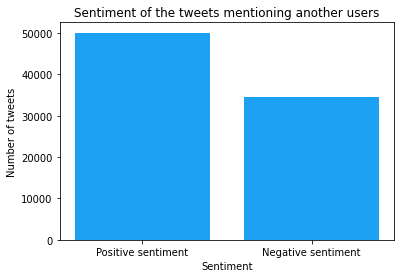

In [212]:
import matplotlib.pyplot as plt


x = [1, 2]
y = [len(df_tweets1.index), len(df_tweets2.index)]
sentiment = ['Positive sentiment', 'Negative sentiment']
plt.bar(x, y, color='#1DA1F2')
plt.xticks(x, sentiment, rotation='horizontal')
plt.title('Sentiment of the tweets mentioning another users')
plt.ylabel('Number of tweets')
plt.xlabel('Sentiment')
plt.show()

So, above is the illustration of my hypothesis being confirmed.
<br> There is one more comparison which could be interesting to look at in the same manner. This time I will use the data on the named entities, namely, how type PERSON correlates with the sentiment of a tweet. For that, we need to go back to the database and use a JOIN query.

In [225]:
con = sqlite3.connect("tweets.db")
df_persons = pd.read_sql_query("SELECT id_ne, id_tweet FROM NEtweets INNER JOIN \
entities ON id_ne = id AND NEType='PERSON'", con)

person_tweets1 = df_persons['id_tweet'].tolist()
person_tweets = []
for tweet in person_tweets1:
    if tweet not in person_tweets:
        person_tweets.append(tweet)

,id_ne,id_tweet
0,6,5
1,7,7
2,30,37
3,34,44
4,40,50
...,...,...
22214,41310,99971
22215,41310,99972
22216,42340,99977
22217,399,99978


In [233]:
persent_df = df_tweets[df_tweets["id"].isin(person_tweets)]
persent_df

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
4,5,i think mi bf is cheating on me!!! ...,0,0,0
6,7,Juuuuuuuuuuuuuuuuussssst Chillin!!,1,0,0
36,37,"SOX! Floyd was great, but relievers nee...",0,0,0
43,44,"... Do I need to even say it? Do I? Well, ...",1,0,0
49,50,another year of Lakers .. That's neither mag...,0,0,0
...,...,...,...,...,...
99970,99971,"@CTerry1985 damn it, dont have sky",0,0,1
99971,99972,@CTerry1985 That's the thing; the new raft of ...,0,0,1
99976,99977,@ctham @Wilsurn Trying to get a wider range of...,1,0,1
99977,99978,@ctham Haha I love the passion in your support,1,0,1


Finally, we get a subset of the *tweets* dataframe which consists only of the tweets which contain named entities classified as person. To have a clearer picture, we need to drop the tweets which mention users, as they are also classified as persons and have already been considered previously.

In [235]:
persent_df = persent_df.drop(persent_df[persent_df["User mentions"] == 1].index)
persent_df

,id,SentimentText,Sentiment,Sup. and/or comp. adjectives,User mentions
4,5,i think mi bf is cheating on me!!! ...,0,0,0
6,7,Juuuuuuuuuuuuuuuuussssst Chillin!!,1,0,0
36,37,"SOX! Floyd was great, but relievers nee...",0,0,0
43,44,"... Do I need to even say it? Do I? Well, ...",1,0,0
49,50,another year of Lakers .. That's neither mag...,0,0,0
...,...,...,...,...,...
73671,73672,- British pop-punk-rock-whateverelse-esque ba...,0,0,0
73673,73674,Chicago trip delayed by one day due to sore ...,0,0,0
84359,84360,"Hoegaarden, cheezits, and an episode of Dext...",0,0,0
84385,84386,my ear hurts. i blame cheap-ass earrings fr...,0,0,0


Now we finally have a dataframe which we can use to make a bar plot. In the first bar, I will put the positive sentiment tweets, and in the second one — the negative sentiment tweets. My hypothesis here is that the number of tweets in the two groups will not differ significantly. In fact, it would be more interesting if we had neutral tweets in the dataset so that we could compare whether person named entities are more oftenly uttered in tweets with a sentiment than in neutral tweets.

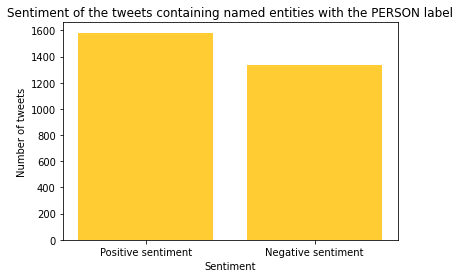

In [237]:
x = [1, 2]
df_tweets[(df_tweets["Sentiment"] == 1) & (df_tweets["User mentions"] == 1)]
y = [len(persent_df[persent_df["Sentiment"] == 1].index), len(persent_df[persent_df["Sentiment"] == 0].index)]
sentiment = ['Positive sentiment', 'Negative sentiment']
plt.bar(x, y, color='#FFCC33')
plt.xticks(x, sentiment, rotation='horizontal')
plt.title('Sentiment of the tweets containing named entities with the PERSON label')
plt.ylabel('Number of tweets')
plt.xlabel('Sentiment')
plt.show()

In [239]:
diff = len(persent_df[persent_df["Sentiment"] == 1].index) - len(persent_df[persent_df["Sentiment"] == 0].index)
diff/len(persent_df.index)

0.08319068812050667

So, as we can see, the difference in number between the positive sentiment tweets and the negative sentiment tweets among those containing PERSON named entities is **not significant** (not in strictly statistical terms though — for this, a more sophisticated statistical analysis is needed).